                                                                                            by Maria

# <center> Road damage detection with YOLO

В данном проекте вам предстоит реализовать систему машинного зрения для детектирования дефектов дорожного полотна с помощью детектора **YOLO (You Only Look Once)**. При работе с данным проектом вы научитесь обучать нейронные сети, осуществлять их инференс, делать оценку работы детектора, а также использовать Docker.


# Материалы


*   **Датасеты:**
·	https://github.com/sekilab/RoadDamageDetector/?tab=readme-ov-file
*   **Статьи:**
·https://www.researchgate.net/publication/363668453_RDD2022_A_multi-national_image_dataset_for_automatic_Road_Damage_Detection
* **Архитектуры нейронных сетей:**
·	https://github.com/ultralytics/ultralytics


# Задание №1

Ознакомьтесь со статьёй, приведенной выше. Всего в датасете представлены данные о состоянии дорог для шести стран: Япония, Индия, Чехия, Норвегия, США, Китай. Кроме того, в датасете есть изображения для 8 классов (таблица 1):

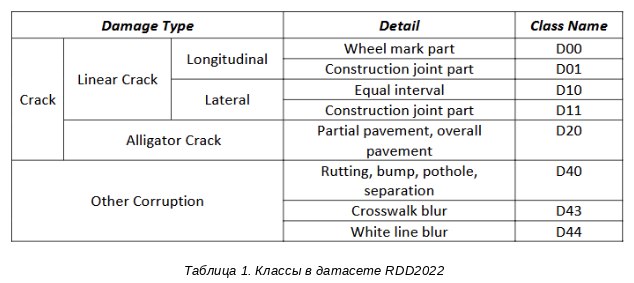



В данном задании вам предстоит использовать датасет для Китая – “RDD2022_China_MotorBike.zip (183.1 MB - train and test)”. Для упрощения задачи предположим, что у нас только один тип повреждения дорожного полотна – «Crack». То есть данный класс объединяет в себе D00, D01, D10, D11, D20.
В данном задании вам необходимо обучить нейронную сеть YOLO v11 для задачи детекции одного класса объектов (только с помощью bounding box).

**Требования к решению:**
1.	Не нужно вносить изменений в архитектуру нейронки. Ваша задача – обучить готовую нейронку на новом датасете и оценить её работу.
2.	В данной задаче будет два ограничения:
*	Метрика IoU для локализации объекта должна быть >= 0,8.
*	Вероятность детекции объекта (confidence threshold) должна быть >= 0,9.
3.	После того, как обучите нейронку, вам необходимо будет оценить её работу с помощью двух метрик:
*	Mean IoU.
*	Precision-Recall Curve
4.	Код должен быть написан в соответствие с парадигмой ООП.
5.	Код должен запускаться из Docker контейнера.
6.	Структура директорий для данной задачи должна выглядеть следующим образом:

```
\---RDD2022
       +---you_code.py
    +---China_MotorBike
    |   +---test
    |   |    +---annotations
    |   |    |   \---xmls
    |   |    +---images
    |   |    |
    |   |    \---predictions
    |   |
    |   \---train
    |       +---annotations
    |       |   \---xmls
    |       \---images

```


7.	Код должен автоматически обрабатывать все данные в папке с тестовыми изображениями (test/images), и сохранять их в папку с предсказанными изображениями (test/predictions) при этом:
*	На обработанном изображении должны отображаться bounding boxes с истинным положением дефектов, положением дефектов, предсказанных нейронной сетью, а также класс и confidence для предсказанного дефекта (Рис.1).
*	В папке с предсказанными изображениями также должен сохраняться график для Precision-Recall Curve и текстовый файл с mean IoU.
8.	Решение должно быть представлено в следующем виде:

*   Dockerfile.
*   Веса вашей обученной модели.
*   Весь необходимый код и инструкции для запуска вашей модели.

In [ ]:
!pip install ultralytics -q

In [ ]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
import shutil
import os
from google.colab import files

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import torch
import torchvision
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from skimage.feature import hog
import time
import cv2
import random
import xml.etree.ElementTree as ET
import re

In [ ]:
torch.cuda.empty_cache()

In [ ]:
if torch.cuda.is_available():
    device = "cuda"
    print("Используется GPU:", torch.cuda.get_device_name(0))
else:
    device = "cpu"
    print("GPU недоступен, используется CPU")

Используется GPU: Tesla T4


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

dataset_path = "/content/drive/MyDrive/Colab Notebooks/Task1"
os.chdir(dataset_path)
print("Текущая директория:", os.getcwd())

Текущая директория: /content/drive/MyDrive/Colab Notebooks/Task1


In [ ]:
import zipfile

zip_path1 = "/content/drive/MyDrive/Colab Notebooks/Task1/RDD2022_Japan.zip"
zip_path2 = "/content/drive/MyDrive/Colab Notebooks/Task1/RDD2022_China_MotorBike.zip"
extract_path = "/content/drive/MyDrive/Colab Notebooks/Task1/"

In [ ]:
with zipfile.ZipFile(zip_path1, 'r') as zip_ref1:
    zip_ref1.extractall(extract_path)

print(f"Архив {zip_path1} распакован в {extract_path}")

Архив /content/drive/MyDrive/Colab Notebooks/Task1/RDD2022_Japan.zip распакован в /content/drive/MyDrive/Colab Notebooks/Task1/


In [ ]:
with zipfile.ZipFile(zip_path2, 'r') as zip_ref2:
    zip_ref2.extractall(extract_path)

print(f"Архив {zip_path2} распакован в {extract_path}")

Архив /content/drive/MyDrive/Colab Notebooks/Task1/RDD2022_China_MotorBike.zip распакован в /content/drive/MyDrive/Colab Notebooks/Task1/


In [ ]:
common_path = "/content/drive/MyDrive/Colab Notebooks/Task1"

jp_train_ds_path = common_path + "/Japan/train/images"
jp_test_ds_path = common_path + "/Japan/test/images"
ch_train_ds_path = common_path + "/China_MotorBike/train/images"
ch_test_ds_path = common_path + "/China_MotorBike/test/images"

In [ ]:
jp_train_ann_path = common_path + "/Japan/train/annotations/xmls"
ch_train_ann_path = common_path + "/China_MotorBike/train/annotations/xmls"

In [ ]:
datasets_img = {
    "Japan Train": jp_train_ds_path,
    "Japan Test": jp_test_ds_path,
    "China Train": ch_train_ds_path,
    "China Test": ch_test_ds_path,
}

In [ ]:
annots = {
    "Japan Train": jp_train_ann_path,
    "China Train": ch_train_ann_path,
}

In [ ]:
#Проверка соответствия картинок и аннотаций (были проблемки с этим, пришлось посуетить)

for dataset_name, image_folder in datasets_img.items():
    if dataset_name in annots:
        annotation_folder = annots[dataset_name]

        image_files = {f.rsplit('.', 1)[0] for f in os.listdir(image_folder) if f.endswith(('.jpg', '.png'))}
        annotation_files = {f.rsplit('.', 1)[0] for f in os.listdir(annotation_folder) if f.endswith('.xml')}

        missing_annotations = image_files - annotation_files  # картинки без аннотаций
        extra_annotations = annotation_files - image_files  # аннотации без картинок

        if missing_annotations:
            print(f"Нет аннотаций для {len(missing_annotations)} изображений: {missing_annotations}")
        else:
            print("Все изображения имеют аннотации")

        if extra_annotations:
            print(f"Есть аннотации без изображений ({len(extra_annotations)} шт.): {extra_annotations}")
        else:
            print("Все аннотации соответствуют изображениям")

Все изображения имеют аннотации
Все аннотации соответствуют изображениям
Все изображения имеют аннотации
Есть аннотации без изображений (395 шт.): {'China_MotorBike_001025', 'China_MotorBike_001905', 'China_MotorBike_001841', 'China_MotorBike_001078', 'China_MotorBike_001494', 'China_MotorBike_001961', 'China_MotorBike_001088', 'China_MotorBike_001710', 'China_MotorBike_000947', 'China_MotorBike_000946', 'China_MotorBike_000552', 'China_MotorBike_001638', 'China_MotorBike_000631', 'China_MotorBike_001636', 'China_MotorBike_000597', 'China_MotorBike_000900', 'China_MotorBike_001046', 'China_MotorBike_001783', 'China_MotorBike_000070', 'China_MotorBike_001644', 'China_MotorBike_000168', 'China_MotorBike_000819', 'China_MotorBike_001464', 'China_MotorBike_000980', 'China_MotorBike_000883', 'China_MotorBike_000406', 'China_MotorBike_000296', 'China_MotorBike_000192', 'China_MotorBike_001267', 'China_MotorBike_000559', 'China_MotorBike_001244', 'China_MotorBike_001423', 'China_MotorBike_001

In [ ]:
"""
def check_duplicates(folder_path):

    duplicates = [f for f in os.listdir(folder_path) if re.search(r"\(\d+\)", f)]
    if duplicates:
        print(f"Найдены дубликаты в {folder_path} ({len(duplicates)} шт.):")
        for file in duplicates:
            print(f"{file}")
    else:
        print(f"Дубликатов нет в {folder_path}")
"""

'\ndef check_duplicates(folder_path):\n\n    duplicates = [f for f in os.listdir(folder_path) if re.search(r"\\(\\d+\\)", f)]\n    if duplicates:\n        print(f"Найдены дубликаты в {folder_path} ({len(duplicates)} шт.):")\n        for file in duplicates:\n            print(f"{file}")\n    else:\n        print(f"Дубликатов нет в {folder_path}")\n'

In [ ]:
"""
check_duplicates(ch_train_ds_path)
check_duplicates(ch_test_ds_path)
check_duplicates(jp_train_ds_path)
check_duplicates(jp_test_ds_path)
"""

'\ncheck_duplicates(ch_train_ds_path)\ncheck_duplicates(ch_test_ds_path)\ncheck_duplicates(jp_train_ds_path)\ncheck_duplicates(jp_test_ds_path)\n'

In [ ]:
"""
def delete_duplicate_files(folder):
    for filename in os.listdir(folder):
        if re.search(r"\(\d+\)", filename):
            file_path = os.path.join(folder, filename)
            os.remove(file_path)
            print(f"Удален файл: {file_path}")
"""

'\ndef delete_duplicate_files(folder):\n    for filename in os.listdir(folder):\n        if re.search(r"\\(\\d+\\)", filename):\n            file_path = os.path.join(folder, filename)\n            os.remove(file_path)\n            print(f"Удален файл: {file_path}")\n'

In [ ]:
"""
delete_duplicate_files(ch_train_ds_path)
delete_duplicate_files(ch_train_ann_path)
"""

'\ndelete_duplicate_files(ch_train_ds_path)\ndelete_duplicate_files(ch_train_ann_path)\n'

In [ ]:
def show_images(folder_name, folder_path):

    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

    if len(image_files) == 0:
        print(f"В папке {folder_name} нет изображений")
        return

    random_images = random.sample(image_files, min(5, len(image_files)))

    plt.figure(figsize=(15, 5))
    for i, img_name in enumerate(random_images):
        img_path = os.path.join(folder_path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(1, 5, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(img_name)

    plt.tight_layout()
    plt.suptitle(folder_name, fontsize=16)
    plt.show()

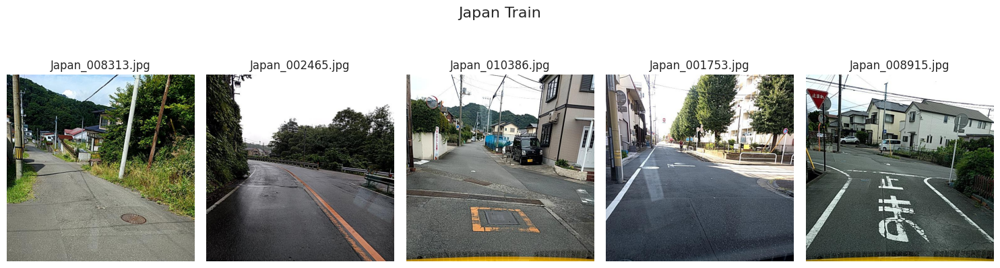

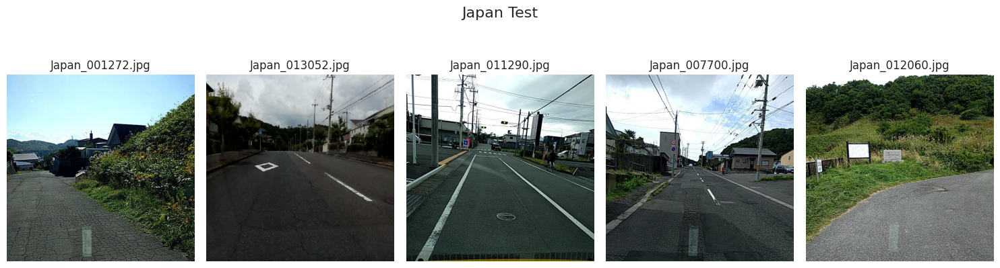

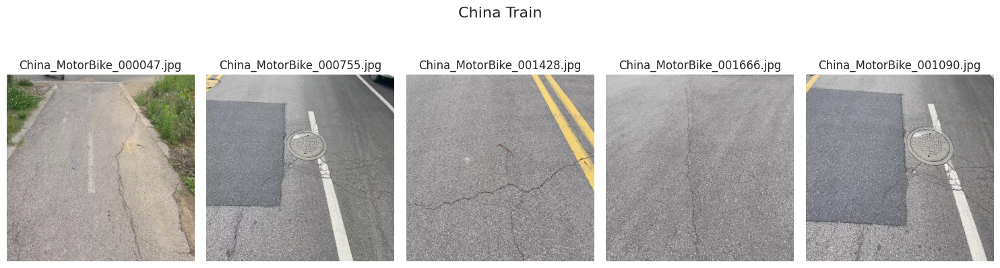

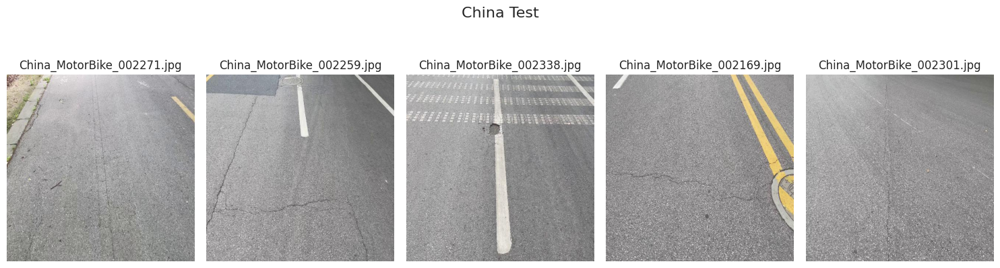

In [ ]:
for folder_name, folder_path in datasets_img.items():
    show_images(folder_name, folder_path)

In [ ]:
train_datasets = {
    "Japan Train": (jp_train_ds_path, jp_train_ann_path),
    "China Train": (ch_train_ds_path, ch_train_ann_path),
}

In [ ]:
def show_images_with_bboxes(folder_name, image_folder, annotation_folder):
    image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

    if len(image_files) == 0:
        print(f"В папке {folder_name} нет изображений")
        return

    random_images = random.sample(image_files, min(5, len(image_files)))

    plt.figure(figsize=(15, 5))
    for i, img_name in enumerate(random_images):
        img_path = os.path.join(image_folder, img_name)
        xml_path = os.path.join(annotation_folder, img_name.replace(".jpg", ".xml"))

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if os.path.exists(xml_path):
            tree = ET.parse(xml_path)
            root = tree.getroot()
            for obj in root.findall("object"):
                class_name = obj.find("name").text
                bbox = obj.find("bndbox")

                xmin = int(bbox.find("xmin").text)
                ymin = int(bbox.find("ymin").text)
                xmax = int(bbox.find("xmax").text)
                ymax = int(bbox.find("ymax").text)

                cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)
                cv2.putText(img, class_name, (xmin, ymin - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        plt.subplot(1, 5, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(img_name)

    plt.tight_layout()
    plt.suptitle(folder_name, fontsize=16)
    plt.show()

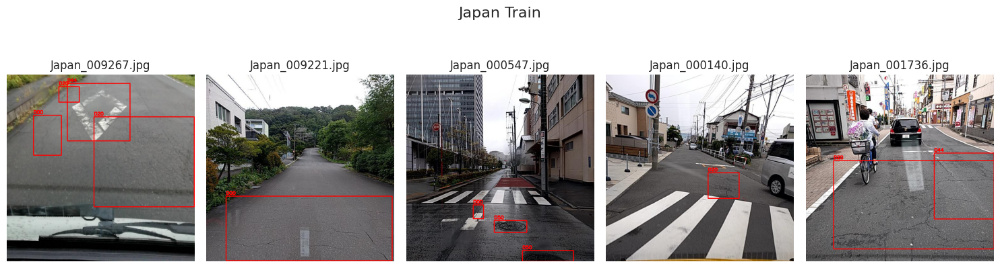

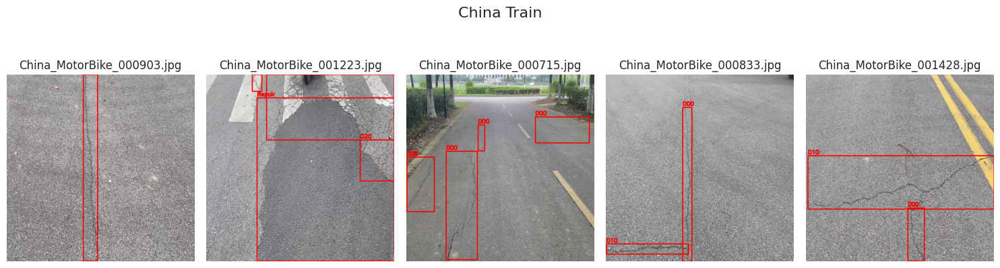

In [ ]:
for folder_name, (image_folder, annotation_folder) in train_datasets.items():
    show_images_with_bboxes(folder_name, image_folder, annotation_folder)

In [ ]:
CLASS_MAPPING = {"D00": "Crack", "D01": "Crack", "D10": "Crack", "D11": "Crack", "D20": "Crack"}
YOLO_CLASS_ID = 0

In [ ]:
def convert_xml_to_yolo(xml_folder, output_folder):
    os.makedirs(output_folder, exist_ok=True)

    for xml_file in os.listdir(xml_folder):
        if not xml_file.endswith(".xml"):
            continue

        tree = ET.parse(os.path.join(xml_folder, xml_file))
        root = tree.getroot()

        size = root.find("size")
        img_width = int(size.find("width").text)
        img_height = int(size.find("height").text)

        yolo_annotations = []

        for obj in root.findall("object"):
            cls = obj.find("name").text
            if cls not in ["D00", "D01", "D10", "D11", "D20"]:
                continue

            bbox = obj.find("bndbox")
            xmin = int(bbox.find("xmin").text)
            ymin = int(bbox.find("ymin").text)
            xmax = int(bbox.find("xmax").text)
            ymax = int(bbox.find("ymax").text)

            x_center = (xmin + xmax) / (2 * img_width)
            y_center = (ymin + ymax) / (2 * img_height)
            width = (xmax - xmin) / img_width
            height = (ymax - ymin) / img_height

            yolo_annotations.append(f"0 {x_center} {y_center} {width} {height}")

        if yolo_annotations:
            txt_filename = os.path.join(output_folder, xml_file.replace(".xml", ".txt"))
            if not os.path.exists(txt_filename):
                with open(txt_filename, "w") as f:
                    f.write("\n".join(yolo_annotations))

In [ ]:
for dataset_name, (image_folder, annotation_folder) in train_datasets.items():
    labels_folder = os.path.join(image_folder, "../labels")
    os.makedirs(labels_folder, exist_ok=True)

    convert_xml_to_yolo(annotation_folder, labels_folder)

In [ ]:

def split_train_validation(train_image_folder, train_label_folder, val_ratio=0.2):

    val_image_folder = train_image_folder.replace("train", "val")
    val_label_folder = train_label_folder.replace("train", "val")
    os.makedirs(val_image_folder, exist_ok=True)
    os.makedirs(val_label_folder, exist_ok=True)

    images = [f for f in os.listdir(train_image_folder) if f.endswith(('.jpg', '.png'))]
    random.shuffle(images)

    val_size = int(len(images) * val_ratio)
    val_images = images[:val_size]
    train_images = images[val_size:]

    for img in val_images:
        shutil.move(os.path.join(train_image_folder, img), os.path.join(val_image_folder, img))
        label = img.replace('.jpg', '.txt').replace('.png', '.txt')
        if os.path.exists(os.path.join(train_label_folder, label)):
            shutil.move(os.path.join(train_label_folder, label), os.path.join(val_label_folder, label))

    print(f"Данные разделены: {len(train_images)} в Train, {len(val_images)} в Validation")

In [ ]:
train_image_folder = "/content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/train/images"
train_label_folder = "/content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/train/labels"

In [ ]:
split_train_validation(train_image_folder, train_label_folder)

Данные разделены: 1582 в Train, 395 в Validation


In [ ]:
yaml_content = f"""
path: {common_path}/China_MotorBike

train: {common_path}/China_MotorBike/train/images
val: {common_path}/China_MotorBike/val/images

nc: 1
names: ["Crack"]
"""

In [ ]:
with open("/content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/data.yaml", "w") as f:
    f.write(yaml_content)

Обучение модели YoloV11m

In [ ]:
yolo_path=common_path+"/yolo11m.pt"

In [ ]:
model = YOLO(yolo_path)

In [ ]:
model.train(
    data=common_path+"/China_MotorBike/data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    project=common_path,
    name="yolo11_training",
    iou=0.7,
    device="cuda"
)

Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/Colab Notebooks/Task1/yolo11m.pt, data=/content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=/content/drive/MyDrive/Colab Notebooks/Task1, name=yolo11_training5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fal

100%|██████████| 755k/755k [00:00<00:00, 22.8MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytics

train: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/train/labels.cache... 1478 images, 104 backgrounds, 0 corrupt: 100%|██████████| 1582/1582 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/val/labels.cache... 372 images, 23 backgrounds, 0 corrupt: 100%|██████████| 395/395 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training5
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.17G      2.433      2.867      2.245         56        640: 100%|██████████| 99/99 [01:25<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:35<00:00,  2.75s/it]

                   all        395        879     0.0449     0.0785    0.00853    0.00212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      8.13G      2.446      2.788      2.303         46        640: 100%|██████████| 99/99 [00:59<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.97it/s]


                   all        395        879     0.0271     0.0193    0.00195   0.000448

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.09G      2.355      2.774      2.253         62        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.73it/s]

                   all        395        879      0.066     0.0796     0.0217    0.00676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      8.16G      2.323      2.733      2.198         53        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.69it/s]

                   all        395        879     0.0716     0.0785     0.0192    0.00517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100       8.1G      2.183      2.668      2.098         45        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.71it/s]

                   all        395        879       0.19       0.15     0.0753     0.0214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      8.05G      2.076      2.542      2.017         50        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.74it/s]

                   all        395        879      0.158      0.197     0.0897     0.0263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      8.12G      2.028      2.461      1.977         61        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.75it/s]

                   all        395        879      0.162      0.367      0.144      0.054



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      8.09G      1.981      2.425      1.935         53        640: 100%|██████████| 99/99 [01:02<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.71it/s]


                   all        395        879      0.277      0.233      0.171     0.0527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      8.11G      1.949      2.386      1.915         67        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.76it/s]


                   all        395        879       0.27      0.266      0.157     0.0575

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      8.12G      1.929      2.333      1.885         67        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.73it/s]

                   all        395        879      0.267      0.359      0.196      0.065



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      8.07G      1.876      2.273      1.845         61        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.74it/s]

                   all        395        879      0.312      0.285      0.233     0.0871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100       8.1G      1.841      2.227      1.818         61        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.71it/s]

                   all        395        879      0.315        0.4      0.274      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       8.1G      1.837      2.201      1.815         66        640: 100%|██████████| 99/99 [01:02<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.82it/s]

                   all        395        879      0.348      0.272      0.239     0.0924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      8.11G       1.82      2.171      1.809         57        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.70it/s]

                   all        395        879      0.405      0.448      0.356      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.16G       1.79      2.134      1.757         49        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.74it/s]

                   all        395        879      0.302      0.431      0.269      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      8.16G      1.767      2.084      1.743         54        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.78it/s]


                   all        395        879      0.337      0.469       0.37      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      8.09G      1.745      2.052      1.736         57        640: 100%|██████████| 99/99 [01:02<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.86it/s]


                   all        395        879      0.418      0.393      0.335      0.141

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      8.12G      1.714      2.021      1.719         59        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.94it/s]

                   all        395        879      0.455      0.484      0.425       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      8.09G      1.716      1.986      1.702         61        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.89it/s]

                   all        395        879      0.413      0.416      0.368      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      8.15G       1.72      1.973      1.712         51        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.83it/s]


                   all        395        879      0.464      0.481      0.414      0.176

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      8.17G      1.674       1.91      1.671         37        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.97it/s]

                   all        395        879      0.509      0.527      0.493      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      8.05G      1.693      1.925      1.663         58        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.96it/s]

                   all        395        879      0.407      0.493      0.397      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100       8.1G      1.671      1.906      1.655         55        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.80it/s]

                   all        395        879      0.466      0.581       0.48      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      8.14G      1.651       1.84      1.639         65        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.77it/s]

                   all        395        879      0.548      0.554      0.538      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      8.09G      1.633      1.858      1.634         55        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.72it/s]

                   all        395        879      0.487      0.543      0.468      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.06G      1.634      1.861      1.634         46        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.74it/s]

                   all        395        879        0.6      0.547      0.568      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      8.12G      1.616      1.831       1.63         42        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.68it/s]


                   all        395        879      0.466      0.568      0.519      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      8.14G      1.614      1.792      1.627         52        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.86it/s]

                   all        395        879      0.548       0.57      0.541      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       8.1G      1.603      1.792      1.611         74        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.91it/s]

                   all        395        879      0.561      0.547       0.56      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      8.12G      1.597      1.782      1.599         69        640: 100%|██████████| 99/99 [01:02<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.92it/s]

                   all        395        879      0.562      0.568      0.561      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.09G       1.59      1.766      1.604         49        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.98it/s]

                   all        395        879      0.467      0.592      0.535      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100       8.1G      1.576      1.763      1.587         54        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.95it/s]

                   all        395        879      0.577      0.568      0.574      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      8.09G      1.571      1.692      1.579         52        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.81it/s]

                   all        395        879      0.531      0.629      0.587      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      8.11G      1.553      1.694       1.57         49        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.76it/s]

                   all        395        879      0.571      0.617      0.612      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      8.16G      1.524      1.652      1.554         45        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.85it/s]


                   all        395        879      0.589      0.623      0.604      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      8.08G      1.527      1.638       1.55         66        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.98it/s]

                   all        395        879      0.666      0.626      0.678      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      8.09G       1.54      1.634      1.556         63        640: 100%|██████████| 99/99 [01:02<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]


                   all        395        879      0.606       0.63      0.619      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      8.12G      1.511       1.62      1.535         53        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.89it/s]

                   all        395        879      0.658      0.644       0.68      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.13G      1.531      1.616      1.526         59        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.81it/s]

                   all        395        879      0.679      0.634      0.671      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      8.11G        1.5      1.607       1.53         50        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.79it/s]

                   all        395        879      0.586      0.662      0.642      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      8.11G      1.497      1.591      1.516         39        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.76it/s]

                   all        395        879      0.673      0.598      0.646      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      8.05G      1.483      1.593      1.523         67        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.86it/s]

                   all        395        879      0.603      0.648       0.65      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      8.16G      1.488      1.599      1.521         57        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.93it/s]

                   all        395        879      0.669      0.596      0.653      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      8.09G      1.472      1.558      1.498         45        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.00it/s]


                   all        395        879      0.703      0.646       0.71      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.11G       1.44      1.499      1.471         91        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]

                   all        395        879      0.681      0.642      0.707      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      8.04G      1.464      1.528      1.488         52        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.89it/s]

                   all        395        879      0.697      0.633      0.706      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      8.09G      1.468      1.526      1.501         33        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.77it/s]

                   all        395        879      0.732      0.676      0.738      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      8.14G      1.436      1.495      1.472         53        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.76it/s]


                   all        395        879      0.683      0.669      0.719      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      8.09G      1.437      1.488      1.474         58        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.83it/s]

                   all        395        879      0.739      0.661      0.719      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.12G      1.407      1.451      1.453         47        640: 100%|██████████| 99/99 [01:00<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.92it/s]

                   all        395        879      0.741      0.677      0.746       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.13G      1.418      1.466      1.464         61        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.87it/s]


                   all        395        879      0.742      0.647      0.744      0.412

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      8.07G      1.396       1.45      1.442         51        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.97it/s]

                   all        395        879      0.773       0.68      0.766      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.16G      1.404      1.421      1.451         58        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.88it/s]

                   all        395        879      0.731      0.688      0.758      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      8.07G      1.395      1.401      1.433         49        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.77it/s]

                   all        395        879      0.746      0.709      0.746       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100       8.1G      1.406      1.414      1.452         48        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.76it/s]


                   all        395        879      0.697      0.714      0.744      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      8.07G      1.396      1.421      1.436         66        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.76it/s]

                   all        395        879      0.748      0.692      0.747      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      8.12G       1.41      1.422       1.45         49        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.86it/s]

                   all        395        879      0.637      0.699      0.721      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      8.06G       1.38      1.393      1.416         63        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.91it/s]


                   all        395        879      0.745      0.701      0.775      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100       8.1G      1.362      1.357      1.411         50        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]


                   all        395        879       0.74      0.703      0.757      0.421

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      8.09G       1.37      1.383      1.421         39        640: 100%|██████████| 99/99 [01:00<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.97it/s]

                   all        395        879      0.765      0.724      0.784      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.12G      1.357      1.347      1.413         48        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.79it/s]

                   all        395        879      0.765      0.725      0.789      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      8.04G      1.359      1.375      1.416         58        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.77it/s]

                   all        395        879      0.791      0.681      0.791      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      8.16G      1.344       1.32      1.403         60        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.82it/s]

                   all        395        879      0.796      0.701      0.799      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      8.14G      1.345       1.33      1.403         40        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]

                   all        395        879       0.74      0.724      0.779      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      8.09G      1.321      1.298      1.386         49        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.95it/s]


                   all        395        879      0.768      0.703      0.775      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      8.12G      1.318      1.308      1.383         61        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.93it/s]

                   all        395        879      0.742      0.711      0.778      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.11G      1.325      1.328      1.396         47        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]


                   all        395        879      0.773      0.745      0.809      0.473

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      8.14G      1.318      1.306      1.384         57        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.81it/s]

                   all        395        879      0.767      0.738      0.799      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.11G      1.323      1.292      1.388         44        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.81it/s]


                   all        395        879      0.768      0.737      0.815      0.471

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.08G      1.312      1.289      1.391         61        640: 100%|██████████| 99/99 [01:00<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.76it/s]

                   all        395        879      0.788      0.758      0.823       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.16G      1.297      1.248      1.372         45        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.90it/s]


                   all        395        879      0.805      0.735      0.819      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      8.07G      1.289      1.261      1.378         69        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.00it/s]

                   all        395        879      0.774      0.741      0.816      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      8.09G      1.302      1.247      1.374         43        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]

                   all        395        879        0.8       0.76       0.83      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.07G      1.281      1.233      1.363         55        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.96it/s]

                   all        395        879      0.816      0.763      0.835      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      8.12G      1.264      1.212      1.358         48        640: 100%|██████████| 99/99 [01:00<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.77it/s]

                   all        395        879      0.783      0.778      0.834      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.14G      1.266      1.225      1.359         46        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.78it/s]

                   all        395        879      0.798       0.76      0.836      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.11G      1.253      1.199      1.343         55        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.76it/s]


                   all        395        879      0.825       0.74      0.833        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      8.05G      1.274      1.202      1.354         48        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.88it/s]


                   all        395        879      0.787       0.77      0.835      0.502

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.13G      1.269      1.197      1.337         52        640: 100%|██████████| 99/99 [01:02<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]


                   all        395        879      0.804      0.739      0.836      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      8.09G      1.279      1.212      1.351         45        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]

                   all        395        879      0.776      0.818      0.854      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.15G      1.235      1.175      1.329         56        640: 100%|██████████| 99/99 [01:00<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.73it/s]

                   all        395        879      0.824      0.771      0.851      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      8.12G      1.228      1.145      1.331         43        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.78it/s]

                   all        395        879      0.812      0.794      0.851      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      8.11G       1.24      1.173      1.335         39        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.80it/s]

                   all        395        879      0.849       0.78       0.87      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      8.14G      1.217      1.144      1.322         48        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.93it/s]


                   all        395        879      0.832      0.763      0.853      0.523

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      8.11G      1.231      1.164      1.324         54        640: 100%|██████████| 99/99 [01:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.98it/s]

                   all        395        879      0.823      0.787      0.865      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      8.05G      1.203      1.133      1.311         49        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.00it/s]


                   all        395        879       0.85      0.778      0.868      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      8.11G      1.204      1.124      1.308         46        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.98it/s]

                   all        395        879       0.83      0.783       0.86      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      8.15G      1.206       1.12      1.309         50        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.83it/s]

                   all        395        879      0.845      0.772      0.848      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      8.09G      1.204      1.123      1.307         72        640: 100%|██████████| 99/99 [01:01<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.69it/s]


                   all        395        879      0.837      0.785      0.867      0.527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      8.07G      1.196      1.105      1.306         44        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.75it/s]


                   all        395        879       0.86      0.778      0.873      0.538
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      8.09G      1.196     0.9822      1.333         25        640: 100%|██████████| 99/99 [01:02<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.98it/s]


                   all        395        879      0.827      0.803      0.881      0.551

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      8.08G      1.155     0.9108      1.298         31        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.98it/s]

                   all        395        879      0.855      0.795      0.884      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      8.09G      1.143     0.8788      1.294         41        640: 100%|██████████| 99/99 [01:00<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.00it/s]


                   all        395        879      0.844      0.796      0.882      0.552

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      8.05G      1.131     0.8694      1.283         26        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.00it/s]

                   all        395        879      0.845      0.807      0.883      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      8.09G       1.13     0.8574      1.287         23        640: 100%|██████████| 99/99 [01:00<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.95it/s]

                   all        395        879      0.859      0.808      0.893      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      8.07G      1.126     0.8549      1.285         35        640: 100%|██████████| 99/99 [01:00<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.84it/s]

                   all        395        879      0.867      0.793      0.892      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      8.09G      1.103     0.8421      1.273         27        640: 100%|██████████| 99/99 [01:00<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.79it/s]

                   all        395        879       0.86      0.807      0.891      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      8.05G      1.094     0.8343      1.262         27        640: 100%|██████████| 99/99 [01:00<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.78it/s]

                   all        395        879      0.847      0.813      0.894      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.09G      1.075     0.8085      1.248         28        640: 100%|██████████| 99/99 [01:00<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.76it/s]

                   all        395        879      0.833      0.828      0.895      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      8.07G      1.081     0.8219      1.258         34        640: 100%|██████████| 99/99 [01:01<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.76it/s]

                   all        395        879      0.833       0.82      0.892      0.573



100 epochs completed in 1.967 hours.
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training5/weights/last.pt, 40.5MB
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training5/weights/best.pt, 40.5MB

Validating /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training5/weights/best.pt...
Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.31it/s]


                   all        395        879      0.833       0.82      0.892      0.573
Speed: 0.2ms preprocess, 12.9ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training5


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f17ae97ce90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

Оценка модели и предсказания

In [ ]:
results = model.val()

Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/val/labels.cache... 372 images, 23 backgrounds, 0 corrupt: 100%|██████████| 395/395 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:13<00:00,  1.80it/s]


                   all        395        879      0.835      0.821      0.893      0.574
Speed: 2.2ms preprocess, 24.0ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training53


In [ ]:
mean_ap50 = results.box.map50
mean_ap50_95 = results.box.map

In [ ]:
print(f"mAP50: {mean_ap50}")
print(f"mAP50-95: {mean_ap50_95}")

mAP50: 0.8929997720834417
mAP50-95: 0.5738889320371763


In [ ]:
print(dir(results.box))

['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'all_ap', 'ap', 'ap50', 'ap_class_index', 'class_result', 'curves', 'curves_results', 'f1', 'f1_curve', 'fitness', 'map', 'map50', 'map75', 'maps', 'mean_results', 'mp', 'mr', 'nc', 'p', 'p_curve', 'prec_values', 'px', 'r', 'r_curve', 'update']


In [ ]:
predictions_path = os.path.join(common_path, "China_MotorBike/test/predictions")
os.makedirs(predictions_path, exist_ok=True)

In [ ]:
with open(os.path.join(predictions_path, "mean_ap.txt"), "w") as f:
    f.write(f"mAP50: {mean_ap50:.4f}\n")
    f.write(f"mAP50-95: {mean_ap50_95:.4f}\n")

In [ ]:
print(results.box.curves)
print(results.box.curves_results)

In [ ]:
pr_curve = results.box.curves_results[0]
recall = pr_curve[0]
precision = pr_curve[1].flatten()

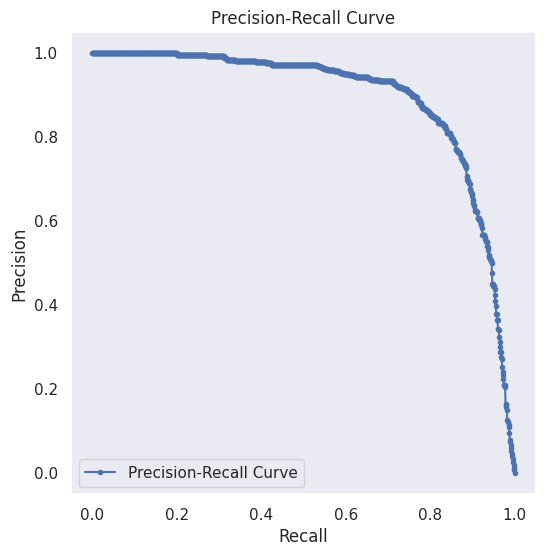

In [ ]:
plt.figure(figsize=(6, 6))
plt.plot(recall, precision, marker=".", label="Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend()
plt.grid()
plt.savefig(os.path.join(predictions_path, "pr_curve.png"))
plt.show()

In [ ]:
model.predict(
    source=os.path.join(common_path, "China_MotorBike/test/images"),
    save=True,
    save_txt=True,
    save_conf=True,
    project=predictions_path,
    name="results",
    iou=0.7
)


image 1/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001977.jpg: 640x640 1 Crack, 37.0ms
image 2/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001978.jpg: 640x640 3 Cracks, 36.8ms
image 3/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001979.jpg: 640x640 9 Cracks, 36.8ms
image 4/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001980.jpg: 640x640 3 Cracks, 36.8ms
image 5/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001981.jpg: 640x640 3 Cracks, 35.5ms
image 6/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001982.jpg: 640x640 5 Cracks, 35.5ms
image 7/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001983.jpg: 640x640 (no detections), 39.5ms
image 8/500 /content/drive/

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Crack'}
 obb: None
 orig_img: array([[[147, 147, 147],
         [152, 152, 152],
         [151, 151, 151],
         ...,
         [175, 175, 175],
         [195, 195, 195],
         [199, 199, 199]],
 
        [[149, 149, 149],
         [144, 144, 144],
         [132, 132, 132],
         ...,
         [207, 207, 207],
         [190, 190, 190],
         [181, 181, 181]],
 
        [[149, 149, 149],
         [143, 143, 143],
         [133, 133, 133],
         ...,
         [194, 194, 194],
         [184, 184, 184],
         [157, 157, 157]],
 
        ...,
 
        [[ 93,  93,  93],
         [158, 158, 158],
         [133, 133, 133],
         ...,
         [191, 190, 192],
         [135, 134, 136],
         [169, 168, 170]],
 
        [[129, 129, 129],
         [130, 130, 130],
         [209, 209, 209],
         ...,
         [161, 160,

Пробую yolo11s с батчем 32

In [ ]:
yolo_path1=common_path+"/yolo11s.pt"

In [ ]:
model1 = YOLO(yolo_path1)

In [ ]:
model1.train(
    data=common_path+"/China_MotorBike/data.yaml",
    epochs=100,
    imgsz=640,
    batch=32,
    project=common_path,
    name="yolo11_training(11s)",
    iou=0.7,
    device="cuda"
)

Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/Colab Notebooks/Task1/yolo11s.pt, data=/content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/data.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=/content/drive/MyDrive/Colab Notebooks/Task1, name=yolo11_training(11s), exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks

train: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/train/labels.cache... 1478 images, 104 backgrounds, 0 corrupt: 100%|██████████| 1582/1582 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/val/labels.cache... 372 images, 23 backgrounds, 0 corrupt: 100%|██████████| 395/395 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(11s)/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(11s)
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      7.99G      2.381      4.321      2.189         54        640: 100%|██████████| 50/50 [00:41<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.20it/s]


                   all        395        879      0.078     0.0592     0.0226    0.00681

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      7.94G      2.277      2.632      2.085         48        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.03s/it]


                   all        395        879   0.000506     0.0535   0.000259   8.26e-05

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      7.97G      2.162      2.511      1.978         56        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.28it/s]


                   all        395        879     0.0655     0.0933     0.0163    0.00442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      7.97G      2.153      2.525      2.007         49        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.14it/s]


                   all        395        879       0.05     0.0853     0.0162    0.00522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      7.96G       2.06      2.419      1.923         63        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.19it/s]


                   all        395        879      0.225      0.164      0.107     0.0366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.95G      2.021      2.361      1.864         48        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]


                   all        395        879      0.145      0.268      0.109     0.0394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      7.95G       1.93      2.247      1.815         37        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.19it/s]


                   all        395        879     0.0663      0.282     0.0456      0.016

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      8.01G      1.912      2.217      1.801         44        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.17it/s]

                   all        395        879      0.339       0.32      0.227     0.0889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      7.98G      1.848      2.138      1.757         46        640: 100%|██████████| 50/50 [00:38<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.14it/s]

                   all        395        879      0.286      0.358      0.246     0.0867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      7.97G      1.819      2.103      1.728         56        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.24it/s]

                   all        395        879      0.363       0.37      0.291      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      7.97G      1.769      2.024      1.692         48        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.17it/s]


                   all        395        879      0.387      0.461      0.395      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      7.98G      1.749      2.009      1.673         55        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]


                   all        395        879      0.379      0.433      0.337      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      7.96G      1.729      1.955      1.669         57        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.24it/s]


                   all        395        879      0.212      0.218       0.13     0.0511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      7.93G      1.709      1.951      1.647         46        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.15it/s]


                   all        395        879      0.457      0.496      0.383      0.159

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      7.96G      1.692        1.9      1.632         55        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]


                   all        395        879      0.502      0.501      0.456      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         8G      1.659      1.853      1.599         52        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        395        879       0.56      0.498      0.489      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.95G      1.669      1.831      1.612         53        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]

                   all        395        879      0.511      0.529      0.496      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      7.96G      1.677      1.844      1.624         46        640: 100%|██████████| 50/50 [00:36<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.01it/s]


                   all        395        879        0.5      0.603       0.53      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      7.95G      1.643      1.791      1.595         46        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.17it/s]


                   all        395        879      0.563      0.553      0.522      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.95G      1.626      1.769      1.579         55        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]


                   all        395        879      0.606      0.592      0.593      0.301

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      7.96G      1.588      1.746      1.548         57        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]


                   all        395        879      0.615      0.546      0.549      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      7.97G      1.595      1.749      1.568         54        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]

                   all        395        879      0.518       0.56      0.522      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      7.96G      1.591       1.71      1.552         47        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]

                   all        395        879      0.582      0.614      0.591      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.97G      1.549      1.672      1.519         58        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]

                   all        395        879      0.606       0.61       0.61      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      7.96G      1.557      1.659      1.506         54        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.08it/s]


                   all        395        879      0.626      0.603      0.604      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.93G      1.528      1.624      1.499         51        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.15it/s]

                   all        395        879      0.628      0.565      0.576      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      8.02G      1.522      1.621      1.501         57        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.28it/s]


                   all        395        879      0.671      0.593      0.608      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      7.95G      1.536      1.606      1.508         51        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.22it/s]

                   all        395        879      0.637      0.649       0.66       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      7.97G      1.508      1.595      1.488         55        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.07it/s]

                   all        395        879      0.665      0.616      0.652      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      7.97G       1.49      1.564      1.474         38        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]

                   all        395        879      0.657      0.563       0.59      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      7.97G      1.505      1.542      1.478         42        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.29it/s]

                   all        395        879      0.696      0.626      0.694      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      7.97G      1.493      1.544      1.468         53        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.10s/it]

                   all        395        879      0.648       0.67      0.689      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      7.97G      1.468      1.508      1.458         48        640: 100%|██████████| 50/50 [00:41<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]

                   all        395        879      0.713      0.625      0.689      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      7.96G      1.453      1.472      1.438         57        640: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]

                   all        395        879      0.673      0.664      0.686      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      7.98G      1.452      1.467      1.436         49        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]

                   all        395        879      0.659      0.652      0.674      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         8G       1.46      1.494      1.448         56        640: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.23it/s]


                   all        395        879      0.646      0.613      0.646       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      7.98G       1.44      1.453      1.429         54        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.24it/s]

                   all        395        879      0.695      0.662      0.701      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      7.95G       1.45      1.457      1.446         51        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.13it/s]

                   all        395        879      0.725      0.712       0.75      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      7.95G      1.423      1.403      1.416         47        640: 100%|██████████| 50/50 [00:36<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.09it/s]

                   all        395        879      0.705      0.681      0.722      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      7.93G      1.418       1.42      1.415         44        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]

                   all        395        879      0.712      0.677      0.722      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      7.96G       1.43      1.413      1.415         59        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        395        879      0.683      0.727      0.744      0.417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      7.98G      1.396      1.391      1.396         57        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]

                   all        395        879       0.74       0.71      0.766       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      7.96G      1.405      1.392      1.407         42        640: 100%|██████████| 50/50 [00:36<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]

                   all        395        879      0.675      0.673       0.71      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      7.97G      1.385      1.368       1.39         54        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.20it/s]

                   all        395        879       0.77      0.677      0.771      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      7.93G      1.387      1.354      1.391         62        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.34it/s]

                   all        395        879      0.734       0.68      0.743      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      7.97G      1.383      1.353      1.385         77        640: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]

                   all        395        879      0.752      0.695      0.759      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.98G      1.368      1.326      1.371         57        640: 100%|██████████| 50/50 [00:36<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.04it/s]

                   all        395        879      0.734      0.709      0.777      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.97G      1.357      1.317      1.365         49        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.29it/s]

                   all        395        879      0.754      0.704      0.764      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.96G      1.375      1.332      1.388         66        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]

                   all        395        879      0.717      0.735      0.763      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.01G      1.364      1.295      1.364         75        640: 100%|██████████| 50/50 [00:40<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.09it/s]

                   all        395        879      0.751      0.704      0.772      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.96G      1.355      1.292      1.368         45        640: 100%|██████████| 50/50 [00:36<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.15it/s]

                   all        395        879      0.771      0.728      0.792      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.95G      1.328       1.28      1.356         66        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]

                   all        395        879      0.749      0.691      0.754      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.96G      1.318      1.266      1.349         70        640: 100%|██████████| 50/50 [00:40<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.03it/s]

                   all        395        879      0.741      0.713      0.777      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.95G      1.328      1.249      1.353         61        640: 100%|██████████| 50/50 [00:39<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.25it/s]

                   all        395        879      0.771      0.684      0.762      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.97G      1.357      1.294      1.368         59        640: 100%|██████████| 50/50 [00:39<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.16it/s]


                   all        395        879        0.8      0.733      0.802      0.477

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.96G      1.321      1.252       1.34         67        640: 100%|██████████| 50/50 [00:36<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.06it/s]

                   all        395        879      0.744      0.747      0.777      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.97G      1.302      1.233      1.341         44        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.22it/s]

                   all        395        879      0.775      0.735      0.803      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.96G      1.311      1.238      1.343         69        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]


                   all        395        879      0.754      0.728      0.767      0.446

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.98G      1.322      1.247      1.348         53        640: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]

                   all        395        879      0.789       0.75       0.82      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      7.96G      1.282       1.21      1.326         39        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.15it/s]


                   all        395        879      0.799      0.744      0.815      0.491

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      7.97G      1.293      1.214      1.324         53        640: 100%|██████████| 50/50 [00:36<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]

                   all        395        879      0.784      0.776      0.824      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      8.01G       1.32      1.227      1.339         84        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.29it/s]

                   all        395        879      0.779      0.745      0.821      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      7.98G      1.292      1.204      1.323         59        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]

                   all        395        879      0.791      0.765      0.821      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      7.96G      1.277      1.193      1.313         69        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.28it/s]

                   all        395        879      0.786      0.787      0.838      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      7.95G      1.258      1.152      1.295         80        640: 100%|██████████| 50/50 [00:36<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]

                   all        395        879      0.803      0.762      0.833      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      7.93G      1.267      1.165        1.3         57        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.24it/s]


                   all        395        879      0.799      0.755      0.817      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.97G      1.264      1.183      1.306         43        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        395        879      0.804      0.766      0.851      0.527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      7.95G      1.243      1.161      1.296         57        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.21it/s]

                   all        395        879       0.79      0.789      0.849      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      7.93G      1.229      1.125      1.274         61        640: 100%|██████████| 50/50 [00:36<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.02it/s]


                   all        395        879      0.788      0.778      0.835       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      7.97G       1.24      1.147      1.292         50        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]


                   all        395        879      0.856      0.769      0.852      0.528

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         8G       1.25      1.156      1.291         51        640: 100%|██████████| 50/50 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]

                   all        395        879      0.794      0.796      0.852      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      7.96G      1.224      1.114      1.283         42        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.25it/s]

                   all        395        879      0.816       0.77      0.851      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      7.93G      1.225      1.116      1.288         47        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.04it/s]

                   all        395        879      0.801      0.767      0.827       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      7.95G      1.212      1.099      1.276         58        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]

                   all        395        879      0.822      0.777      0.856       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      7.96G      1.223      1.113      1.286         47        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.17it/s]

                   all        395        879       0.82      0.795      0.862      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      7.97G      1.206      1.085      1.269         43        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.11it/s]

                   all        395        879       0.84      0.771      0.856      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      7.96G      1.198      1.081      1.262         59        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]


                   all        395        879      0.825      0.797      0.873      0.546

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      7.96G      1.207      1.051      1.273         55        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        395        879      0.832      0.802      0.875      0.541

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         8G      1.176      1.067      1.261         52        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.15it/s]

                   all        395        879      0.835      0.772       0.86      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      7.97G      1.185       1.07      1.251         53        640: 100%|██████████| 50/50 [00:36<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.04it/s]

                   all        395        879      0.844      0.797      0.875      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.03G      1.191      1.093      1.256         53        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.28it/s]

                   all        395        879      0.824      0.797      0.873      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      8.01G      1.172      1.049      1.249         70        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]

                   all        395        879      0.848      0.809      0.881      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      7.96G      1.181       1.05      1.246         63        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.14it/s]

                   all        395        879      0.829      0.811      0.866      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      7.97G      1.165      1.051      1.239         51        640: 100%|██████████| 50/50 [00:36<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.09it/s]


                   all        395        879       0.82       0.81       0.87      0.546

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      8.01G       1.17       1.03      1.239         48        640: 100%|██████████| 50/50 [00:38<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.33it/s]


                   all        395        879      0.843      0.816      0.882      0.567

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      7.96G      1.174      1.023      1.249         45        640: 100%|██████████| 50/50 [00:38<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]

                   all        395        879      0.815      0.825      0.877      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      7.96G      1.143      1.018      1.227         48        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]

                   all        395        879      0.831       0.81      0.875      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      8.02G       1.13     0.9928      1.223         53        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.19it/s]

                   all        395        879      0.835      0.823      0.889      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      7.97G       1.13      1.015      1.223         51        640: 100%|██████████| 50/50 [00:39<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]

                   all        395        879      0.838      0.809      0.877      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      7.98G      1.139      1.016      1.235         53        640: 100%|██████████| 50/50 [00:40<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.07s/it]

                   all        395        879      0.838      0.804      0.884      0.567


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      7.93G      1.122     0.8751      1.252         28        640: 100%|██████████| 50/50 [00:39<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.34it/s]

                   all        395        879      0.842      0.814      0.883      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      7.93G      1.093     0.8036      1.221         30        640: 100%|██████████| 50/50 [00:36<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]

                   all        395        879       0.87      0.827      0.898      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      7.93G      1.083     0.7926      1.219         37        640: 100%|██████████| 50/50 [00:36<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.14it/s]

                   all        395        879      0.863      0.841      0.902      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      7.93G      1.075     0.7862      1.216         28        640: 100%|██████████| 50/50 [00:38<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.14it/s]

                   all        395        879      0.837      0.832      0.894      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      7.93G      1.071     0.7674      1.203         23        640: 100%|██████████| 50/50 [00:36<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]

                   all        395        879      0.849      0.837      0.903      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      7.96G      1.036     0.7578      1.193         36        640: 100%|██████████| 50/50 [00:36<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]


                   all        395        879      0.854      0.849      0.905       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      7.93G      1.035     0.7545      1.184         27        640: 100%|██████████| 50/50 [00:36<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.44it/s]


                   all        395        879      0.854      0.842      0.901      0.584

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      7.93G      1.027     0.7323      1.183         27        640: 100%|██████████| 50/50 [00:35<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.18it/s]

                   all        395        879      0.856      0.844      0.906      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      7.93G      1.033     0.7486      1.186         30        640: 100%|██████████| 50/50 [00:35<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.06it/s]

                   all        395        879      0.846      0.851      0.907      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      7.93G      1.017     0.7245      1.179         33        640: 100%|██████████| 50/50 [00:34<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]

                   all        395        879      0.873      0.837      0.906      0.595



100 epochs completed in 1.269 hours.
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(11s)/weights/last.pt, 19.2MB
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(11s)/weights/best.pt, 19.2MB

Validating /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(11s)/weights/best.pt...
Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:09<00:00,  1.42s/it]


                   all        395        879      0.873      0.837      0.906      0.595
Speed: 0.3ms preprocess, 5.2ms inference, 0.0ms loss, 5.6ms postprocess per image
Results saved to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(11s)


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d9d789ae490>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
results1 = model1.val()

Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/val/labels.cache... 372 images, 23 backgrounds, 0 corrupt: 100%|██████████| 395/395 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:11<00:00,  1.11it/s]


                   all        395        879      0.873      0.837      0.906      0.595
Speed: 1.1ms preprocess, 11.9ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(11s)2


In [ ]:
mean_ap50vs = results1.box.map50
mean_ap50_95vs = results1.box.map

In [ ]:
print(f"mAP50: {mean_ap50vs}")
print(f"mAP50-95: {mean_ap50_95vs}")

mAP50: 0.9056108541385086
mAP50-95: 0.59479091769495


Результаты получше!

In [ ]:
predictions_path1 = os.path.join(common_path, "China_MotorBike/test/predictions1")
os.makedirs(predictions_path1, exist_ok=True)

In [ ]:
with open(os.path.join(predictions_path1, "mean_ap.txt"), "w") as f:
    f.write(f"mAP50: {mean_ap50vs:.4f}\n")
    f.write(f"mAP50-95: {mean_ap50_95vs:.4f}\n")

In [ ]:
pr_curve1 = results1.box.curves_results[0]
recall1 = pr_curve1[0]
precision1 = pr_curve1[1].flatten()

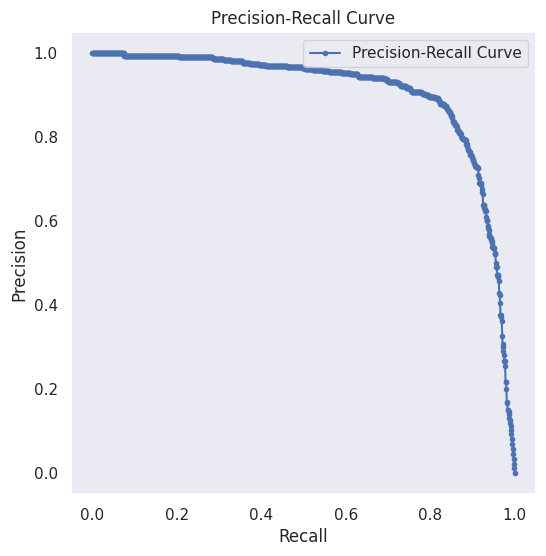

In [ ]:
plt.figure(figsize=(6, 6))
plt.plot(recall1, precision1, marker=".", label="Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend()
plt.grid()
plt.savefig(os.path.join(predictions_path1, "pr_curve.png"))
plt.show()

In [ ]:
model1.predict(
    source=os.path.join(common_path, "China_MotorBike/test/images"),
    save=True,
    save_txt=True,
    save_conf=True,
    project=predictions_path1,
    name="results1",
    iou=0.7
)


image 1/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001977.jpg: 640x640 2 Cracks, 20.7ms
image 2/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001978.jpg: 640x640 3 Cracks, 15.6ms
image 3/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001979.jpg: 640x640 8 Cracks, 15.6ms
image 4/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001980.jpg: 640x640 3 Cracks, 15.6ms
image 5/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001981.jpg: 640x640 3 Cracks, 15.6ms
image 6/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001982.jpg: 640x640 4 Cracks, 47.6ms
image 7/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001983.jpg: 640x640 (no detections), 18.6ms
image 8/500 /content/drive

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Crack'}
 obb: None
 orig_img: array([[[147, 147, 147],
         [152, 152, 152],
         [151, 151, 151],
         ...,
         [175, 175, 175],
         [195, 195, 195],
         [199, 199, 199]],
 
        [[149, 149, 149],
         [144, 144, 144],
         [132, 132, 132],
         ...,
         [207, 207, 207],
         [190, 190, 190],
         [181, 181, 181]],
 
        [[149, 149, 149],
         [143, 143, 143],
         [133, 133, 133],
         ...,
         [194, 194, 194],
         [184, 184, 184],
         [157, 157, 157]],
 
        ...,
 
        [[ 93,  93,  93],
         [158, 158, 158],
         [133, 133, 133],
         ...,
         [191, 190, 192],
         [135, 134, 136],
         [169, 168, 170]],
 
        [[129, 129, 129],
         [130, 130, 130],
         [209, 209, 209],
         ...,
         [161, 160,

Пробую yolo11s со стандартным IOU = 0.5

In [ ]:
model2 = YOLO(yolo_path1)

In [ ]:
model2.train(
    data=common_path+"/China_MotorBike/data.yaml",
    epochs=100,
    imgsz=640,
    batch=32,
    project=common_path,
    name="yolo11_training(yolo11s_iou0.5)",
    device="cuda"
)

Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/Colab Notebooks/Task1/yolo11s.pt, data=/content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/data.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=/content/drive/MyDrive/Colab Notebooks/Task1, name=yolo11_training(yolo11s_iou0.5), exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, r

train: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/train/labels.cache... 1478 images, 104 backgrounds, 0 corrupt: 100%|██████████| 1582/1582 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/val/labels.cache... 372 images, 23 backgrounds, 0 corrupt: 100%|██████████| 395/395 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(yolo11s_iou0.5)/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(yolo11s_iou0.5)
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.24G      2.381      4.321      2.189         54        640: 100%|██████████| 50/50 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.06it/s]

                   all        395        879      0.078     0.0592     0.0226    0.00681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      8.15G      2.277      2.632      2.085         48        640: 100%|██████████| 50/50 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.15it/s]

                   all        395        879   0.000506     0.0535   0.000259   8.26e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.18G      2.162      2.511      1.978         56        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.11it/s]


                   all        395        879     0.0655     0.0933     0.0163    0.00442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      8.17G      2.153      2.525      2.007         49        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.03s/it]

                   all        395        879       0.05     0.0853     0.0162    0.00522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      8.18G       2.06      2.419      1.923         63        640: 100%|██████████| 50/50 [00:39<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]

                   all        395        879      0.225      0.164      0.107     0.0366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      8.17G      2.021      2.361      1.864         48        640: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.00it/s]


                   all        395        879      0.145      0.268      0.109     0.0394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      8.14G       1.93      2.247      1.815         37        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.14it/s]


                   all        395        879     0.0663      0.282     0.0456      0.016

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      8.21G      1.912      2.217      1.801         44        640: 100%|██████████| 50/50 [00:39<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.28it/s]


                   all        395        879      0.339       0.32      0.227     0.0889

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      8.18G      1.848      2.138      1.757         46        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.02it/s]


                   all        395        879      0.286      0.358      0.246     0.0867

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      8.17G      1.819      2.103      1.728         56        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.04it/s]


                   all        395        879      0.363       0.37      0.291      0.126

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      8.18G      1.769      2.024      1.692         48        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.24it/s]


                   all        395        879      0.387      0.461      0.395      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      8.18G      1.749      2.009      1.673         55        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.08it/s]

                   all        395        879      0.379      0.433      0.337      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      8.18G      1.729      1.955      1.669         57        640: 100%|██████████| 50/50 [00:36<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.02it/s]

                   all        395        879      0.212      0.218       0.13     0.0511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      8.15G      1.709      1.951      1.647         46        640: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.21it/s]


                   all        395        879      0.457      0.496      0.383      0.159

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.18G      1.692        1.9      1.632         55        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]

                   all        395        879      0.502      0.501      0.456      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      8.22G      1.659      1.853      1.599         52        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.18it/s]


                   all        395        879       0.56      0.498      0.489      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      8.17G      1.669      1.831      1.612         53        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.08it/s]

                   all        395        879      0.511      0.529      0.496      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       8.2G      1.677      1.844      1.624         46        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.29it/s]


                   all        395        879        0.5      0.603       0.53      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      8.18G      1.643      1.791      1.595         46        640: 100%|██████████| 50/50 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]


                   all        395        879      0.563      0.553      0.522      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      8.17G      1.626      1.769      1.579         55        640: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]

                   all        395        879      0.606      0.592      0.593      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      8.19G      1.588      1.746      1.548         57        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.20it/s]


                   all        395        879      0.615      0.546      0.549      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      8.17G      1.595      1.749      1.568         54        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]

                   all        395        879      0.518       0.56      0.522      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      8.17G      1.591       1.71      1.552         47        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]

                   all        395        879      0.582      0.614      0.591      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      8.19G      1.549      1.672      1.519         58        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.02it/s]


                   all        395        879      0.606       0.61       0.61      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      8.18G      1.557      1.659      1.506         54        640: 100%|██████████| 50/50 [00:39<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.29it/s]


                   all        395        879      0.626      0.603      0.604      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.15G      1.528      1.624      1.499         51        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.34it/s]

                   all        395        879      0.628      0.565      0.576      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      8.22G      1.522      1.621      1.501         57        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.14it/s]

                   all        395        879      0.671      0.593      0.608      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      8.17G      1.536      1.606      1.508         51        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]


                   all        395        879      0.637      0.649       0.66       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      8.19G      1.508      1.595      1.488         55        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.19it/s]

                   all        395        879      0.665      0.616      0.652      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      8.19G       1.49      1.564      1.474         38        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.20it/s]

                   all        395        879      0.657      0.563       0.59      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.19G      1.505      1.542      1.478         42        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.09it/s]


                   all        395        879      0.696      0.626      0.694      0.373

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      8.17G      1.493      1.544      1.468         53        640: 100%|██████████| 50/50 [00:39<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]


                   all        395        879      0.648       0.67      0.689      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      8.19G      1.468      1.508      1.458         48        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.07it/s]

                   all        395        879      0.713      0.625      0.689      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      8.17G      1.453      1.472      1.438         57        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]


                   all        395        879      0.673      0.664      0.686      0.365

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      8.18G      1.452      1.467      1.436         49        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.33it/s]

                   all        395        879      0.659      0.652      0.674      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      8.21G       1.46      1.494      1.448         56        640: 100%|██████████| 50/50 [00:36<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]

                   all        395        879      0.646      0.613      0.646       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      8.19G       1.44      1.453      1.429         54        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.22it/s]


                   all        395        879      0.695      0.662      0.701      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      8.17G       1.45      1.457      1.446         51        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        395        879      0.725      0.712       0.75      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.16G      1.423      1.403      1.416         47        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.01it/s]


                   all        395        879      0.705      0.681      0.722      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      8.16G      1.418       1.42      1.415         44        640: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]

                   all        395        879      0.712      0.677      0.722      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      8.19G       1.43      1.413      1.415         59        640: 100%|██████████| 50/50 [00:38<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.33it/s]


                   all        395        879      0.683      0.727      0.744      0.417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      8.19G      1.396      1.391      1.396         57        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.06it/s]


                   all        395        879       0.74       0.71      0.766       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      8.17G      1.405      1.392      1.407         42        640: 100%|██████████| 50/50 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.16it/s]

                   all        395        879      0.675      0.673       0.71      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      8.19G      1.385      1.368       1.39         54        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.03it/s]

                   all        395        879       0.77      0.677      0.771      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.14G      1.387      1.354      1.391         62        640: 100%|██████████| 50/50 [00:39<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]


                   all        395        879      0.734       0.68      0.743      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      8.19G      1.383      1.353      1.385         77        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]

                   all        395        879      0.752      0.695      0.759      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      8.18G      1.368      1.326      1.371         57        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.09it/s]


                   all        395        879      0.734      0.709      0.777      0.449

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      8.19G      1.357      1.317      1.365         49        640: 100%|██████████| 50/50 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.28it/s]

                   all        395        879      0.754      0.704      0.764      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      8.18G      1.375      1.332      1.388         66        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.13it/s]

                   all        395        879      0.717      0.735      0.763      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.21G      1.364      1.295      1.364         75        640: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.13it/s]


                   all        395        879      0.751      0.704      0.772      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.17G      1.355      1.292      1.368         45        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.28it/s]

                   all        395        879      0.771      0.728      0.792      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      8.18G      1.328       1.28      1.356         66        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.04it/s]

                   all        395        879      0.749      0.691      0.754      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.18G      1.318      1.266      1.349         70        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]


                   all        395        879      0.741      0.713      0.777      0.463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      8.17G      1.328      1.249      1.353         61        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.08it/s]

                   all        395        879      0.771      0.684      0.762      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      8.17G      1.357      1.294      1.368         59        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]

                   all        395        879        0.8      0.733      0.802      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      8.18G      1.321      1.252       1.34         67        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]

                   all        395        879      0.744      0.747      0.777      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      8.18G      1.302      1.233      1.341         44        640: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.25it/s]

                   all        395        879      0.775      0.735      0.803      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      8.18G      1.311      1.238      1.343         69        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]


                   all        395        879      0.754      0.728      0.767      0.446

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      8.19G      1.322      1.247      1.348         53        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.22it/s]

                   all        395        879      0.789       0.75       0.82      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      8.17G      1.282       1.21      1.326         39        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]

                   all        395        879      0.799      0.744      0.815      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.18G      1.293      1.214      1.324         53        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.25it/s]

                   all        395        879      0.784      0.776      0.824      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      8.23G       1.32      1.227      1.339         84        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]

                   all        395        879      0.779      0.745      0.821      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      8.19G      1.292      1.204      1.323         59        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]

                   all        395        879      0.791      0.765      0.821      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      8.17G      1.277      1.193      1.313         69        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.13it/s]

                   all        395        879      0.786      0.787      0.838      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      8.16G      1.258      1.152      1.295         80        640: 100%|██████████| 50/50 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]


                   all        395        879      0.803      0.762      0.833      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      8.16G      1.267      1.165        1.3         57        640: 100%|██████████| 50/50 [00:39<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.28it/s]

                   all        395        879      0.799      0.755      0.817      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.17G      1.264      1.183      1.306         43        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.01it/s]

                   all        395        879      0.804      0.766      0.851      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      8.17G      1.243      1.161      1.296         57        640: 100%|██████████| 50/50 [00:40<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]

                   all        395        879       0.79      0.789      0.849      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.17G      1.229      1.125      1.274         61        640: 100%|██████████| 50/50 [00:37<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]

                   all        395        879      0.788      0.778      0.835       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.16G       1.24      1.147      1.292         50        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.29it/s]

                   all        395        879      0.856      0.769      0.852      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.21G       1.25      1.156      1.291         51        640: 100%|██████████| 50/50 [00:40<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]

                   all        395        879      0.794      0.796      0.852      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      8.18G      1.224      1.114      1.283         42        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]

                   all        395        879      0.816       0.77      0.851      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      8.15G      1.225      1.116      1.288         47        640: 100%|██████████| 50/50 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]

                   all        395        879      0.801      0.767      0.827       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.19G      1.212      1.099      1.276         58        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.16it/s]

                   all        395        879      0.822      0.777      0.856       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      8.18G      1.223      1.113      1.286         47        640: 100%|██████████| 50/50 [00:41<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


                   all        395        879       0.82      0.795      0.862      0.533

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.17G      1.206      1.085      1.269         43        640: 100%|██████████| 50/50 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.24it/s]

                   all        395        879       0.84      0.771      0.856      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.18G      1.198      1.081      1.262         59        640: 100%|██████████| 50/50 [00:37<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.11it/s]


                   all        395        879      0.825      0.797      0.873      0.546

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      8.18G      1.207      1.051      1.273         55        640: 100%|██████████| 50/50 [00:39<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]

                   all        395        879      0.832      0.802      0.875      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.22G      1.176      1.067      1.261         52        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.07it/s]

                   all        395        879      0.835      0.772       0.86      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      8.17G      1.185       1.07      1.251         53        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.17it/s]

                   all        395        879      0.844      0.797      0.875      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.22G      1.191      1.093      1.256         53        640: 100%|██████████| 50/50 [00:40<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.29it/s]

                   all        395        879      0.824      0.797      0.873      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      8.21G      1.172      1.049      1.249         70        640: 100%|██████████| 50/50 [00:37<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.06it/s]

                   all        395        879      0.848      0.809      0.881      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      8.17G      1.181       1.05      1.246         63        640: 100%|██████████| 50/50 [00:42<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.16it/s]

                   all        395        879      0.829      0.811      0.866      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      8.17G      1.165      1.051      1.239         51        640: 100%|██████████| 50/50 [00:36<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.00s/it]

                   all        395        879       0.82       0.81       0.87      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      8.22G       1.17       1.03      1.239         48        640: 100%|██████████| 50/50 [00:38<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]

                   all        395        879      0.843      0.816      0.882      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      8.19G      1.174      1.023      1.249         45        640: 100%|██████████| 50/50 [00:40<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.01s/it]

                   all        395        879      0.815      0.825      0.877      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      8.17G      1.143      1.018      1.227         48        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]

                   all        395        879      0.831       0.81      0.875      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      8.22G       1.13     0.9928      1.223         53        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]

                   all        395        879      0.835      0.823      0.889      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      8.17G       1.13      1.015      1.223         51        640: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.04it/s]

                   all        395        879      0.838      0.809      0.877      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      8.18G      1.139      1.016      1.235         53        640: 100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]

                   all        395        879      0.838      0.804      0.884      0.567


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      8.13G      1.122     0.8751      1.252         28        640: 100%|██████████| 50/50 [00:40<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]


                   all        395        879      0.842      0.814      0.883      0.565

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      8.13G      1.093     0.8036      1.221         30        640: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.06it/s]

                   all        395        879       0.87      0.827      0.898      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      8.17G      1.083     0.7926      1.219         37        640: 100%|██████████| 50/50 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]

                   all        395        879      0.863      0.841      0.902      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      8.15G      1.075     0.7862      1.216         28        640: 100%|██████████| 50/50 [00:35<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]

                   all        395        879      0.837      0.832      0.894      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      8.13G      1.071     0.7674      1.203         23        640: 100%|██████████| 50/50 [00:35<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.25it/s]


                   all        395        879      0.849      0.837      0.903      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      8.18G      1.036     0.7578      1.193         36        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]

                   all        395        879      0.854      0.849      0.905       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      8.13G      1.035     0.7545      1.184         27        640: 100%|██████████| 50/50 [00:35<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.08it/s]

                   all        395        879      0.854      0.842      0.901      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      8.14G      1.027     0.7323      1.183         27        640: 100%|██████████| 50/50 [00:35<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.22it/s]

                   all        395        879      0.856      0.844      0.906      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.14G      1.033     0.7486      1.186         30        640: 100%|██████████| 50/50 [00:36<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.17it/s]

                   all        395        879      0.846      0.851      0.907      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      8.13G      1.017     0.7245      1.179         33        640: 100%|██████████| 50/50 [00:35<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.17it/s]

                   all        395        879      0.873      0.837      0.906      0.595



100 epochs completed in 1.299 hours.
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(yolo11s_iou0.5)/weights/last.pt, 19.2MB
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(yolo11s_iou0.5)/weights/best.pt, 19.2MB

Validating /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(yolo11s_iou0.5)/weights/best.pt...
Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.45s/it]


                   all        395        879      0.873      0.837      0.906      0.595
Speed: 0.4ms preprocess, 5.3ms inference, 0.0ms loss, 5.2ms postprocess per image
Results saved to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(yolo11s_iou0.5)


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d9d73160090>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
results2 = model2.val()

Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/val/labels.cache... 372 images, 23 backgrounds, 0 corrupt: 100%|██████████| 395/395 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:12<00:00,  1.08it/s]


                   all        395        879      0.873      0.837      0.906      0.595
Speed: 1.1ms preprocess, 12.3ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to /content/drive/MyDrive/Colab Notebooks/Task1/yolo11_training(yolo11s_iou0.5)2


In [ ]:
mean_ap50vs2 = results2.box.map50
mean_ap50_95vs2 = results2.box.map

In [ ]:
print(f"mAP50: {mean_ap50_95vs2}")
print(f"mAP50-95: {mean_ap50_95vs2}")

mAP50: 0.59479091769495
mAP50-95: 0.59479091769495


In [ ]:
predictions_path2 = os.path.join(common_path, "China_MotorBike/test/predictions2")
os.makedirs(predictions_path2, exist_ok=True)

In [ ]:
with open(os.path.join(predictions_path2, "mean_ap.txt"), "w") as f:
    f.write(f"mAP50: {mean_ap50vs2:.4f}\n")
    f.write(f"mAP50-95: {mean_ap50_95vs2:.4f}\n")

In [ ]:
pr_curve2 = results2.box.curves_results[0]
recall2 = pr_curve2[0]
precision2 = pr_curve2[1].flatten()

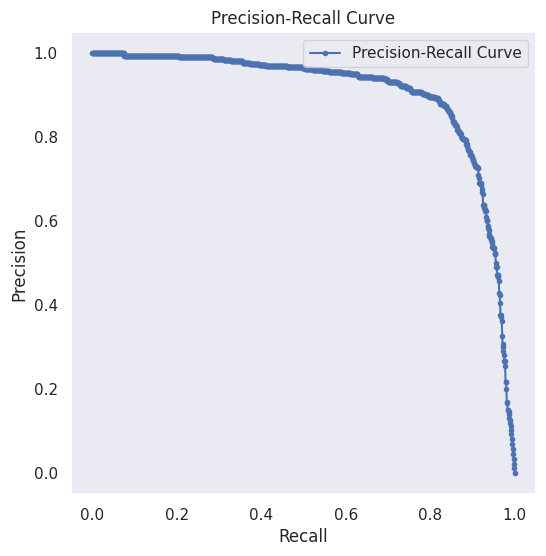

In [ ]:
plt.figure(figsize=(6, 6))
plt.plot(recall2, precision2, marker=".", label="Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend()
plt.grid()
plt.savefig(os.path.join(predictions_path2, "pr_curve.png"))
plt.show()

In [ ]:
model2.predict(
    source=os.path.join(common_path, "China_MotorBike/test/images"),
    save=True,
    save_txt=True,
    save_conf=True,
    project=predictions_path2,
    name="results2",
    iou=0.5
)


image 1/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001977.jpg: 640x640 1 Crack, 15.6ms
image 2/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001978.jpg: 640x640 3 Cracks, 15.6ms
image 3/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001979.jpg: 640x640 7 Cracks, 15.5ms
image 4/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001980.jpg: 640x640 3 Cracks, 15.6ms
image 5/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001981.jpg: 640x640 3 Cracks, 15.6ms
image 6/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001982.jpg: 640x640 3 Cracks, 19.5ms
image 7/500 /content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike/test/images/China_MotorBike_001983.jpg: 640x640 (no detections), 15.7ms
image 8/500 /content/drive/

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Crack'}
 obb: None
 orig_img: array([[[147, 147, 147],
         [152, 152, 152],
         [151, 151, 151],
         ...,
         [175, 175, 175],
         [195, 195, 195],
         [199, 199, 199]],
 
        [[149, 149, 149],
         [144, 144, 144],
         [132, 132, 132],
         ...,
         [207, 207, 207],
         [190, 190, 190],
         [181, 181, 181]],
 
        [[149, 149, 149],
         [143, 143, 143],
         [133, 133, 133],
         ...,
         [194, 194, 194],
         [184, 184, 184],
         [157, 157, 157]],
 
        ...,
 
        [[ 93,  93,  93],
         [158, 158, 158],
         [133, 133, 133],
         ...,
         [191, 190, 192],
         [135, 134, 136],
         [169, 168, 170]],
 
        [[129, 129, 129],
         [130, 130, 130],
         [209, 209, 209],
         ...,
         [161, 160,

Упорядочиваю код выше по принципам ООП (одно из требований к выполнению проекта)

In [ ]:
class DatasetProcessor:
    """
    Класс для обработки датасета: конвертация аннотаций, разбиение на train/val, создание YAML-файла.
    """
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path

    def convert_xml_to_yolo(self, xml_folder, output_folder):
        os.makedirs(output_folder, exist_ok=True)

        for xml_file in os.listdir(xml_folder):
            if not xml_file.endswith(".xml"):
                continue

            tree = ET.parse(os.path.join(xml_folder, xml_file))
            root = tree.getroot()
            size = root.find("size")
            img_width, img_height = int(size.find("width").text), int(size.find("height").text)
            yolo_annotations = []

            for obj in root.findall("object"):
                cls = obj.find("name").text
                if cls not in ["D00", "D01", "D10", "D11", "D20"]:
                    continue

                cls_id = 0
                bbox = obj.find("bndbox")
                xmin, ymin, xmax, ymax = [int(bbox.find(tag).text) for tag in ["xmin", "ymin", "xmax", "ymax"]]
                x_center, y_center = (xmin + xmax) / (2 * img_width), (ymin + ymax) / (2 * img_height)
                width, height = (xmax - xmin) / img_width, (ymax - ymin) / img_height
                yolo_annotations.append(f"{cls_id} {x_center} {y_center} {width} {height}")

            if yolo_annotations:
                txt_filename = os.path.join(output_folder, xml_file.replace(".xml", ".txt"))
                with open(txt_filename, "w") as f:
                    f.write("\n".join(yolo_annotations))

    def split_train_validation(self, train_image_folder, train_label_folder, val_ratio=0.2):
        val_image_folder = os.path.join(self.dataset_path, "val/images")
        val_label_folder = os.path.join(self.dataset_path, "val/labels")
        os.makedirs(val_image_folder, exist_ok=True)
        os.makedirs(val_label_folder, exist_ok=True)

        images = [f for f in os.listdir(train_image_folder) if f.endswith(('.jpg', '.png'))]
        random.shuffle(images)
        val_size = int(len(images) * val_ratio)
        val_images = images[:val_size]
        train_images = images[val_size:]

        for img in val_images:
            shutil.move(os.path.join(train_image_folder, img), os.path.join(val_image_folder, img))
            label = img.replace('.jpg', '.txt').replace('.png', '.txt')
            if os.path.exists(os.path.join(train_label_folder, label)):
                shutil.move(os.path.join(train_label_folder, label), os.path.join(val_label_folder, label))

        print(f"Данные разделены: {len(train_images)} в Train, {len(val_images)} в Validation")

    def create_yaml(self):
        yaml_content = f"""path: {self.dataset_path}
train: {self.dataset_path}/train/images
val: {self.dataset_path}/val/images
nc: 1
names: [\"Crack\"]"""
        yaml_path = os.path.join(self.dataset_path, "data.yaml")
        with open(yaml_path, "w") as f:
            f.write(yaml_content)

In [ ]:
class YOLOTrainer:
    """
    Класс для обучения YOLO11
    """
    def __init__(self, model_path, data_yaml, dataset_path, epochs=100, batch_size=32, img_size=640, device="cuda"):
        self.model = YOLO(model_path)
        self.data_yaml = data_yaml
        self.dataset_path = dataset_path
        self.epochs = epochs
        self.batch_size = batch_size
        self.img_size = img_size
        self.device = device

    def train(self):
        self.model.train(
            data=self.data_yaml,
            epochs=self.epochs,
            imgsz=self.img_size,
            batch=self.batch_size,
            device=self.device,
            iou=0.7,
            project=os.path.join(self.dataset_path, "runs/train"),
            name="yolo_training"
        )
        return self.model

In [ ]:
class YOLOEvaluator:
    """
    Класс для оценки модели YOLO11: вычисление mean IoU и построение Precision-Recall Curve
    """
    def __init__(self, model, test_images_folder, predictions_path):
        self.model = model
        self.test_images_folder = test_images_folder
        self.predictions_path = predictions_path
        os.makedirs(self.predictions_path, exist_ok=True)

    def evaluate(self):
        results = self.model.val()
        mean_ap50 = results.box.map50
        mean_ap50_95 = results.box.map
        with open(os.path.join(self.predictions_path, "mean_ap.txt"), "w") as f:
            f.write(f"mAP50: {mean_ap50:.4f}\n")
            f.write(f"mAP50-95: {mean_ap50_95:.4f}\n")
        return mean_ap50, mean_ap50_95

In [ ]:
if __name__ == "__main__":
    dataset_path = "/content/drive/MyDrive/Colab Notebooks/Task1/China_MotorBike"
    dataset_processor = DatasetProcessor(dataset_path)
    dataset_processor.convert_xml_to_yolo(f"{dataset_path}/train/annotations/xmls", f"{dataset_path}/train/labels")
    dataset_processor.split_train_validation(f"{dataset_path}/train/images", f"{dataset_path}/train/labels")
    dataset_processor.create_yaml()

    trainer = YOLOTrainer("yolo11m.pt", f"{dataset_path}/data.yaml", dataset_path)
    trained_model = trainer.train()

    evaluator = YOLOEvaluator(trained_model, f"{dataset_path}/test/images", f"{dataset_path}/test/predictions")
    evaluator.evaluate()

    trained_model.predict(
        source=f"{dataset_path}/test/images",
        save=True,
        save_txt=True,
        save_conf=True,
        project=f"{dataset_path}/test/predictions",
        name="results",
        iou=0.7
    )
    print(f"Предсказания сохранены в {dataset_path}/test/predictions/results")

# Задание №2
Теперь давайте расширим работу нейронной сети на большее количество классов. Фактически вам нужно использовать код, который вы сделали в Задании№1, но теперь ваша нейронка должна классифицировать 4 класса объектов:
1.	Linear Longitudinal Crack (D00+D01)
2.	Linear Lateral Crack (D10+D11)
3.	Alligator Crack (D20)
4.	Other Corruption (D40+D43+D44)

Для решения данной задачи используйте следующий датасет: RDD2022_Japan.zip (1022.9 MB - train and test).
В данной задаче вам нужно построить Precision-Recall Curve, только уже для задачи со множеством классов. А также вам нужно вычислить метрику mAP (mean Average Precision) – тоже для мультиклассовой задачи.


In [ ]:
class DatasetProcessor:
    """
    Класс для обработки датасета: конвертация аннотаций, разбиение на train/val, создание YAML-файла.
    """
    CLASS_MAPPING = {
        "D00": 0,  # Linear Longitudinal Crack
        "D01": 0,
        "D10": 1,  # Linear Lateral Crack
        "D11": 1,
        "D20": 2,  # Alligator Crack
        "D40": 3,  # Other Corruption
        "D43": 3,
        "D44": 3
    }

    def __init__(self, dataset_path):
        self.dataset_path = dataset_path

    def convert_xml_to_yolo(self, xml_folder, output_folder):
        os.makedirs(output_folder, exist_ok=True)

        for xml_file in os.listdir(xml_folder):
            if not xml_file.endswith(".xml"):
                continue

            tree = ET.parse(os.path.join(xml_folder, xml_file))
            root = tree.getroot()
            size = root.find("size")
            img_width, img_height = int(size.find("width").text), int(size.find("height").text)
            yolo_annotations = []

            for obj in root.findall("object"):
                cls = obj.find("name").text
                if cls not in self.CLASS_MAPPING:
                    continue

                cls_id = self.CLASS_MAPPING[cls]
                bbox = obj.find("bndbox")
                xmin, ymin, xmax, ymax = [int(bbox.find(tag).text) for tag in ["xmin", "ymin", "xmax", "ymax"]]
                x_center, y_center = (xmin + xmax) / (2 * img_width), (ymin + ymax) / (2 * img_height)
                width, height = (xmax - xmin) / img_width, (ymax - ymin) / img_height
                yolo_annotations.append(f"{cls_id} {x_center} {y_center} {width} {height}")

            if yolo_annotations:
                txt_filename = os.path.join(output_folder, xml_file.replace(".xml", ".txt"))
                with open(txt_filename, "w") as f:
                    f.write("\n".join(yolo_annotations))

    def split_train_validation(self, train_image_folder, train_label_folder, val_ratio=0.2):
        val_image_folder = os.path.join(self.dataset_path, "val", "images")
        val_label_folder = os.path.join(self.dataset_path, "val", "labels")
        os.makedirs(val_image_folder, exist_ok=True)
        os.makedirs(val_label_folder, exist_ok=True)

        images = [f for f in os.listdir(train_image_folder) if f.endswith(('.jpg', '.png'))]
        random.shuffle(images)
        val_size = int(len(images) * val_ratio)
        val_images = images[:val_size]
        train_images = images[val_size:]

        for img in val_images:
            shutil.move(os.path.join(train_image_folder, img), os.path.join(val_image_folder, img))
            label = img.replace('.jpg', '.txt').replace('.png', '.txt')
            if os.path.exists(os.path.join(train_label_folder, label)):
                shutil.move(os.path.join(train_label_folder, label), os.path.join(val_label_folder, label))

        print(f"Данные разделены: {len(train_images)} в Train, {len(val_images)} в Validation")

    def create_yaml(self):
        yaml_content = f"""path: {self.dataset_path}
train: {os.path.join(self.dataset_path, 'train', 'images')}
val: {os.path.join(self.dataset_path, 'val', 'images')}
nc: {len(set(self.CLASS_MAPPING.values()))}
names: ["Linear Longitudinal Crack", "Linear Lateral Crack", "Alligator Crack", "Other Corruption"]
"""

        yaml_path = os.path.join(self.dataset_path, "data.yaml")
        with open(yaml_path, "w") as f:
            f.write(yaml_content)
        print(f"YAML файл создан: {yaml_path}")

In [ ]:
class YOLOEvaluator:
    """
    Класс для оценки модели: вычисление mean IoU, Precision-Recall Curve и mAP.
    """
    def __init__(self, model, test_images_folder, predictions_path):
        self.model = model
        self.test_images_folder = test_images_folder
        self.predictions_path = predictions_path
        os.makedirs(self.predictions_path, exist_ok=True)

    def evaluate(self):
        results = self.model.val(project=os.path.join(self.predictions_path, "val_results"))
        mean_ap50 = results.box.map50  # mAP@50
        mean_ap50_95 = results.box.map  # mAP@50-95

        with open(os.path.join(self.predictions_path, "mean_ap.txt"), "w") as f:
            f.write(f"mAP50: {mean_ap50:.4f}\n")
            f.write(f"mAP50-95: {mean_ap50_95:.4f}\n")

        print(f"mAP50: {mean_ap50:.4f}, mAP50-95: {mean_ap50_95:.4f}")
        return mean_ap50, mean_ap50_95

    def plot_precision_recall(self):
        results = self.model.val(project=self.predictions_path, name="pr_curve_eval")
        pr_curve = results.box.curves_results[0]
        recall = pr_curve[0]
        precision = pr_curve[1].flatten()

        plt.figure(figsize=(6, 6))
        plt.plot(recall, precision, marker=".", label="Precision-Recall Curve")
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("Precision-Recall Curve")
        plt.legend()
        plt.grid()

        plt.savefig(os.path.join(self.predictions_path, "pr_curve.png"))
        plt.show()

In [ ]:
if __name__ == "__main__":
    dataset_path = "/content/drive/MyDrive/Colab Notebooks/Task1/Japan"
    processor = DatasetProcessor(dataset_path)

    os.makedirs(f"{dataset_path}/train/labels", exist_ok=True)
    os.makedirs(f"{dataset_path}/val/labels", exist_ok=True)
    os.makedirs(f"{dataset_path}/test/predictions", exist_ok=True)

    processor.convert_xml_to_yolo(f"{dataset_path}/train/annotations/xmls", f"{dataset_path}/train/labels")
    processor.split_train_validation(f"{dataset_path}/train/images", f"{dataset_path}/train/labels")
    processor.create_yaml()

    trainer = YOLOTrainer(yolo_path1, os.path.join(dataset_path, "data.yaml"), dataset_path)
    trained_model = trainer.train()

Данные разделены: 8405 в Train, 2101 в Validation
YAML файл создан: /content/drive/MyDrive/Colab Notebooks/Task1/Japan/data.yaml
Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/Colab Notebooks/Task1/yolo11s.pt, data=/content/drive/MyDrive/Colab Notebooks/Task1/Japan/data.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=/content/drive/MyDrive/Colab Notebooks/Task1/Japan, name=yolo_training, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=N

train: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/Japan/train/labels... 7448 images, 957 backgrounds, 0 corrupt: 100%|██████████| 8405/8405 [03:06<00:00, 45.18it/s]

train: WARNING ⚠️ /content/drive/MyDrive/Colab Notebooks/Task1/Japan/train/images/Japan_006536.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/Colab Notebooks/Task1/Japan/train/images/Japan_011427.jpg: 1 duplicate labels removed


train: New cache created: /content/drive/MyDrive/Colab Notebooks/Task1/Japan/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/Japan/val/labels... 1863 images, 238 backgrounds, 0 corrupt: 100%|██████████| 2101/2101 [00:49<00:00, 42.87it/s]


val: New cache created: /content/drive/MyDrive/Colab Notebooks/Task1/Japan/val/labels.cache
Plotting labels to /content/drive/MyDrive/Colab Notebooks/Task1/Japan/yolo_training/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Colab Notebooks/Task1/Japan/yolo_training
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      13.1G      2.029      3.325      1.942         77        640: 100%|██████████| 263/263 [05:20<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:48<00:00,  1.46s/it]


                   all       2101       4218      0.333      0.327      0.255      0.111

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      8.39G      1.875      2.318       1.73         61        640: 100%|██████████| 263/263 [04:50<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:45<00:00,  1.39s/it]


                   all       2101       4218      0.382      0.308      0.252      0.108

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.37G      1.942      2.402      1.787         64        640: 100%|██████████| 263/263 [03:56<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.11s/it]


                   all       2101       4218      0.171      0.159      0.103     0.0402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      8.36G      2.038      2.556      1.879         73        640: 100%|██████████| 263/263 [03:45<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.09s/it]


                   all       2101       4218      0.227      0.279      0.182     0.0732

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      8.43G      1.963      2.438      1.827         62        640: 100%|██████████| 263/263 [03:51<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.13s/it]


                   all       2101       4218      0.308      0.319      0.237     0.0921

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      8.41G      1.935      2.375      1.803         76        640: 100%|██████████| 263/263 [03:53<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.12s/it]


                   all       2101       4218      0.331      0.353      0.292      0.125

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100       8.4G      1.885      2.285      1.769         63        640: 100%|██████████| 263/263 [03:51<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.11s/it]


                   all       2101       4218      0.355      0.338      0.307      0.137

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      8.37G      1.866      2.244      1.754         68        640: 100%|██████████| 263/263 [03:46<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.06s/it]


                   all       2101       4218       0.39      0.349      0.307      0.134

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      8.38G      1.837      2.197      1.734         76        640: 100%|██████████| 263/263 [03:53<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.13s/it]


                   all       2101       4218      0.387      0.389      0.356      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      8.37G      1.821      2.163       1.72         86        640: 100%|██████████| 263/263 [03:45<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.10s/it]


                   all       2101       4218      0.389      0.406      0.349      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      8.38G      1.807      2.107      1.705         69        640: 100%|██████████| 263/263 [03:43<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.11s/it]


                   all       2101       4218      0.388       0.43      0.378      0.176

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      8.36G      1.793      2.092      1.695         91        640: 100%|██████████| 263/263 [03:46<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.11s/it]


                   all       2101       4218      0.429      0.425      0.388      0.182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      8.38G      1.775      2.073       1.68         59        640: 100%|██████████| 263/263 [03:57<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.10s/it]


                   all       2101       4218       0.43       0.44      0.397      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      8.36G       1.76      2.045      1.671         84        640: 100%|██████████| 263/263 [03:54<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:38<00:00,  1.17s/it]


                   all       2101       4218      0.477      0.455      0.436      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.39G      1.761      2.029      1.662         62        640: 100%|██████████| 263/263 [03:53<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:38<00:00,  1.16s/it]


                   all       2101       4218      0.431      0.431      0.396      0.192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100       8.4G      1.737      2.002      1.645         58        640: 100%|██████████| 263/263 [03:47<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.10s/it]


                   all       2101       4218      0.482       0.48       0.46      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      8.43G      1.731      1.988      1.647         70        640: 100%|██████████| 263/263 [03:50<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.10s/it]


                   all       2101       4218       0.47      0.464      0.448      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      8.36G      1.729      1.971      1.639         44        640: 100%|██████████| 263/263 [03:49<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.13s/it]


                   all       2101       4218      0.497      0.475      0.454      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      8.39G      1.713      1.947      1.634         56        640: 100%|██████████| 263/263 [03:47<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:34<00:00,  1.05s/it]


                   all       2101       4218      0.479      0.462      0.442      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      8.41G       1.71      1.935      1.628         66        640: 100%|██████████| 263/263 [03:50<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.09s/it]


                   all       2101       4218      0.488      0.469      0.461      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       8.4G        1.7      1.917      1.618         77        640: 100%|██████████| 263/263 [03:48<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.13s/it]


                   all       2101       4218      0.494      0.502       0.48      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      8.32G      1.698      1.909      1.619         81        640: 100%|██████████| 263/263 [03:43<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:38<00:00,  1.17s/it]


                   all       2101       4218      0.488       0.48      0.473      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      8.43G      1.694      1.889      1.613         86        640: 100%|██████████| 263/263 [03:47<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:33<00:00,  1.03s/it]


                   all       2101       4218      0.496      0.494      0.477      0.234

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      8.36G      1.675      1.856      1.593         81        640: 100%|██████████| 263/263 [03:49<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:38<00:00,  1.16s/it]


                   all       2101       4218      0.518      0.482      0.478      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      8.39G      1.678      1.867      1.603         64        640: 100%|██████████| 263/263 [03:53<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.07s/it]


                   all       2101       4218      0.509      0.499      0.485      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.35G      1.662      1.841      1.588         73        640: 100%|██████████| 263/263 [03:43<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.13s/it]


                   all       2101       4218      0.507      0.481      0.483      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      8.41G      1.656       1.83      1.586         80        640: 100%|██████████| 263/263 [03:54<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:38<00:00,  1.18s/it]


                   all       2101       4218      0.523      0.514      0.503       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       8.4G       1.66      1.816       1.59         55        640: 100%|██████████| 263/263 [03:49<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:33<00:00,  1.02s/it]


                   all       2101       4218       0.53      0.493      0.497       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      8.37G       1.65      1.806      1.584         60        640: 100%|██████████| 263/263 [03:46<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.06s/it]


                   all       2101       4218      0.516      0.513      0.504      0.253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      8.37G      1.647      1.793      1.571         65        640: 100%|██████████| 263/263 [03:48<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:38<00:00,  1.15s/it]


                   all       2101       4218      0.505      0.512        0.5      0.253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.38G       1.63       1.79      1.565         60        640: 100%|██████████| 263/263 [03:42<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:32<00:00,  1.02it/s]


                   all       2101       4218      0.512      0.518      0.506      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      8.37G      1.639      1.791      1.566         68        640: 100%|██████████| 263/263 [03:49<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.10s/it]


                   all       2101       4218      0.521      0.515      0.515       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      8.38G      1.629      1.767      1.564         68        640: 100%|██████████| 263/263 [03:52<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.08s/it]


                   all       2101       4218      0.536      0.523       0.52      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      8.35G      1.621      1.769      1.567         63        640: 100%|██████████| 263/263 [03:49<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.11s/it]


                   all       2101       4218      0.553      0.522      0.534      0.271

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      8.44G      1.611      1.742      1.557         67        640: 100%|██████████| 263/263 [03:53<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.12s/it]


                   all       2101       4218      0.535      0.514      0.517      0.262

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      8.36G      1.615      1.742      1.551         68        640: 100%|██████████| 263/263 [03:54<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.08s/it]


                   all       2101       4218      0.541      0.539      0.533      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      8.42G      1.606      1.722      1.549         55        640: 100%|██████████| 263/263 [03:44<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:31<00:00,  1.05it/s]


                   all       2101       4218      0.552       0.53      0.536      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      8.36G      1.602      1.706      1.534         74        640: 100%|██████████| 263/263 [03:49<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.09s/it]

                   all       2101       4218      0.555      0.532      0.543      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.39G      1.602      1.706      1.537         83        640: 100%|██████████| 263/263 [03:53<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.13s/it]

                   all       2101       4218      0.553      0.539      0.542      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      8.36G      1.593      1.696      1.534         79        640: 100%|██████████| 263/263 [03:48<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:34<00:00,  1.06s/it]


                   all       2101       4218      0.543      0.534       0.54      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      8.39G      1.597      1.691      1.532         62        640: 100%|██████████| 263/263 [03:53<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.13s/it]


                   all       2101       4218      0.558      0.543      0.542      0.274

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      8.37G      1.587      1.673      1.526         80        640: 100%|██████████| 263/263 [03:56<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:38<00:00,  1.15s/it]

                   all       2101       4218      0.543      0.557      0.547      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      8.37G      1.583       1.67      1.521         69        640: 100%|██████████| 263/263 [03:44<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.06s/it]


                   all       2101       4218      0.552      0.549       0.55      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      8.35G      1.578      1.672      1.521         72        640: 100%|██████████| 263/263 [03:49<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.08s/it]


                   all       2101       4218      0.556      0.549       0.55       0.28

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.38G      1.572      1.642      1.508         70        640: 100%|██████████| 263/263 [03:43<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:34<00:00,  1.04s/it]


                   all       2101       4218      0.562      0.551      0.559      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       8.4G      1.581      1.656       1.52         65        640: 100%|██████████| 263/263 [03:46<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.09s/it]


                   all       2101       4218      0.558      0.556      0.559      0.287

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      8.38G      1.564      1.632      1.513         79        640: 100%|██████████| 263/263 [03:50<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:34<00:00,  1.04s/it]


                   all       2101       4218      0.572      0.556      0.569       0.29

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      8.35G      1.555      1.623      1.499         77        640: 100%|██████████| 263/263 [03:46<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:34<00:00,  1.05s/it]


                   all       2101       4218      0.579      0.555      0.564      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      8.38G      1.549      1.624      1.502         80        640: 100%|██████████| 263/263 [03:50<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.12s/it]


                   all       2101       4218      0.572      0.563      0.575      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.36G      1.558      1.613      1.504         49        640: 100%|██████████| 263/263 [03:45<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:33<00:00,  1.02s/it]


                   all       2101       4218      0.588      0.557      0.579      0.296

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.38G      1.543      1.605      1.493         61        640: 100%|██████████| 263/263 [03:48<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.10s/it]

                   all       2101       4218      0.586      0.557      0.577      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      8.35G      1.543      1.605      1.494         51        640: 100%|██████████| 263/263 [03:55<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.12s/it]

                   all       2101       4218      0.562      0.573      0.572      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.39G      1.543      1.601      1.493         84        640: 100%|██████████| 263/263 [03:47<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.08s/it]


                   all       2101       4218       0.58      0.569      0.577      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      8.35G      1.538      1.582      1.487         75        640: 100%|██████████| 263/263 [03:54<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:33<00:00,  1.03s/it]


                   all       2101       4218      0.591      0.557      0.578      0.297

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      8.39G      1.525      1.557      1.486         92        640: 100%|██████████| 263/263 [03:51<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:34<00:00,  1.06s/it]


                   all       2101       4218      0.577      0.561      0.577      0.299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      8.35G      1.526      1.565      1.477         72        640: 100%|██████████| 263/263 [03:40<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:32<00:00,  1.01it/s]


                   all       2101       4218      0.589      0.563      0.579      0.301

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      8.38G       1.52      1.545      1.474         75        640: 100%|██████████| 263/263 [03:47<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.08s/it]

                   all       2101       4218      0.599      0.562      0.583      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      8.35G      1.517       1.54      1.468         60        640: 100%|██████████| 263/263 [03:43<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.11s/it]


                   all       2101       4218      0.594      0.569      0.587      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100       8.4G      1.502      1.529      1.461         65        640: 100%|██████████| 263/263 [03:46<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:39<00:00,  1.19s/it]


                   all       2101       4218      0.581      0.584      0.587      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      8.36G      1.507      1.521      1.461         45        640: 100%|██████████| 263/263 [03:47<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.11s/it]

                   all       2101       4218      0.585      0.575      0.591      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.38G      1.503      1.508      1.465         40        640: 100%|██████████| 263/263 [03:42<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.14s/it]


                   all       2101       4218      0.595      0.566       0.59      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      8.37G      1.498      1.501      1.458         58        640: 100%|██████████| 263/263 [03:42<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.07s/it]


                   all       2101       4218      0.588       0.57      0.587      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      8.38G      1.501      1.504      1.455         58        640: 100%|██████████| 263/263 [03:42<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.08s/it]

                   all       2101       4218      0.601       0.57      0.595      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      8.36G      1.496      1.503      1.451         63        640: 100%|██████████| 263/263 [03:50<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:38<00:00,  1.16s/it]


                   all       2101       4218      0.579      0.579      0.587      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      8.36G      1.476      1.474      1.444         44        640: 100%|██████████| 263/263 [03:56<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.09s/it]

                   all       2101       4218      0.576      0.578      0.586      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      8.36G      1.472       1.46      1.439         66        640: 100%|██████████| 263/263 [03:47<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.14s/it]


                   all       2101       4218      0.583      0.573      0.588      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.38G      1.474      1.455      1.437         70        640: 100%|██████████| 263/263 [03:58<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.08s/it]

                   all       2101       4218      0.601      0.566      0.585      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      8.35G      1.467      1.442       1.43         62        640: 100%|██████████| 263/263 [03:47<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.09s/it]


                   all       2101       4218      0.589      0.582      0.589      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.41G      1.457      1.437      1.429         66        640: 100%|██████████| 263/263 [03:46<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.08s/it]

                   all       2101       4218       0.58      0.583      0.587      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.35G      1.465      1.445      1.432         66        640: 100%|██████████| 263/263 [03:52<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.09s/it]

                   all       2101       4218      0.601      0.572       0.59      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.39G      1.465      1.424       1.43         60        640: 100%|██████████| 263/263 [03:51<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.15s/it]

                   all       2101       4218      0.597      0.569      0.589      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      8.37G      1.449      1.412       1.42         46        640: 100%|██████████| 263/263 [03:48<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.11s/it]


                   all       2101       4218      0.603       0.57       0.59      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      8.38G      1.443      1.397      1.412         90        640: 100%|██████████| 263/263 [03:58<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.12s/it]

                   all       2101       4218      0.607       0.57      0.591      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.35G      1.442      1.384      1.413         66        640: 100%|██████████| 263/263 [03:48<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:34<00:00,  1.05s/it]

                   all       2101       4218      0.605      0.568      0.593      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      8.45G      1.434      1.381      1.411         55        640: 100%|██████████| 263/263 [03:46<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:38<00:00,  1.18s/it]

                   all       2101       4218      0.609      0.575      0.595      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.37G      1.428      1.367      1.406         53        640: 100%|██████████| 263/263 [03:43<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.07s/it]

                   all       2101       4218      0.607      0.574      0.598      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.38G      1.425      1.357      1.405         57        640: 100%|██████████| 263/263 [03:40<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:33<00:00,  1.01s/it]

                   all       2101       4218      0.611      0.567      0.598       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      8.37G      1.424      1.351        1.4         71        640: 100%|██████████| 263/263 [03:48<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:38<00:00,  1.16s/it]

                   all       2101       4218      0.609      0.578      0.597      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.38G      1.411      1.345      1.397         69        640: 100%|██████████| 263/263 [03:48<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.11s/it]

                   all       2101       4218      0.607       0.58      0.595      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      8.36G      1.419      1.347      1.396         58        640: 100%|██████████| 263/263 [03:48<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.12s/it]

                   all       2101       4218      0.603       0.58      0.596      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.42G      1.405      1.325      1.385         86        640: 100%|██████████| 263/263 [03:57<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.09s/it]


                   all       2101       4218      0.592      0.588      0.595      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      8.35G      1.398      1.319      1.384         69        640: 100%|██████████| 263/263 [03:52<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.10s/it]

                   all       2101       4218      0.601      0.579      0.596      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      8.44G      1.392      1.313      1.377         68        640: 100%|██████████| 263/263 [03:47<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.08s/it]


                   all       2101       4218      0.608      0.577      0.594      0.309

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      8.35G      1.387      1.302      1.376         72        640: 100%|██████████| 263/263 [03:55<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:34<00:00,  1.05s/it]


                   all       2101       4218      0.618      0.575      0.595      0.307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100       8.4G      1.386      1.302      1.375         70        640: 100%|██████████| 263/263 [03:45<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.12s/it]


                   all       2101       4218      0.615      0.574      0.593      0.307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      8.41G       1.37      1.287      1.367         51        640: 100%|██████████| 263/263 [03:52<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.08s/it]


                   all       2101       4218      0.599      0.587      0.594      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      8.38G      1.371      1.281      1.366         81        640: 100%|██████████| 263/263 [03:54<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.11s/it]

                   all       2101       4218      0.604       0.58      0.594      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      8.35G      1.364      1.266      1.364         61        640: 100%|██████████| 263/263 [03:45<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:35<00:00,  1.08s/it]

                   all       2101       4218      0.604      0.583      0.594      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      8.38G      1.363      1.266      1.363         78        640: 100%|██████████| 263/263 [03:50<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:36<00:00,  1.12s/it]


                   all       2101       4218      0.609      0.583      0.594      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      8.36G      1.352      1.246      1.355         72        640: 100%|██████████| 263/263 [03:53<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:37<00:00,  1.13s/it]

                   all       2101       4218      0.616      0.577      0.593      0.305


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      8.34G      1.352      1.164      1.393         35        640: 100%|██████████| 263/263 [03:37<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:31<00:00,  1.06it/s]

                   all       2101       4218      0.615      0.576      0.593      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      8.32G      1.336      1.135      1.382         37        640: 100%|██████████| 263/263 [03:32<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:31<00:00,  1.04it/s]


                   all       2101       4218      0.614       0.57      0.591      0.305

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      8.37G      1.311        1.1      1.369         40        640: 100%|██████████| 263/263 [03:33<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:31<00:00,  1.06it/s]

                   all       2101       4218      0.608      0.573      0.592      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      8.32G      1.309      1.086      1.362         38        640: 100%|██████████| 263/263 [03:32<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:31<00:00,  1.06it/s]

                   all       2101       4218      0.613      0.571      0.591      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      8.37G      1.293      1.077      1.358         33        640: 100%|██████████| 263/263 [03:32<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:32<00:00,  1.02it/s]

                   all       2101       4218      0.615      0.565      0.591      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      8.32G      1.288      1.068      1.353         43        640: 100%|██████████| 263/263 [03:36<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:31<00:00,  1.05it/s]

                   all       2101       4218       0.61      0.569       0.59      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      8.34G      1.283      1.056      1.347         45        640: 100%|██████████| 263/263 [03:32<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:32<00:00,  1.00it/s]

                   all       2101       4218      0.611      0.572       0.59      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      8.32G      1.282       1.05      1.346         28        640: 100%|██████████| 263/263 [03:33<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:31<00:00,  1.03it/s]

                   all       2101       4218      0.607      0.576      0.589      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.34G      1.275      1.042      1.344         44        640: 100%|██████████| 263/263 [03:32<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:32<00:00,  1.03it/s]


                   all       2101       4218      0.607      0.578      0.589        0.3

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      8.32G      1.272      1.038      1.343         42        640: 100%|██████████| 263/263 [03:33<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:31<00:00,  1.03it/s]

                   all       2101       4218      0.607      0.578      0.587      0.299



100 epochs completed in 7.496 hours.
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Task1/Japan/yolo_training/weights/last.pt, 19.2MB
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Task1/Japan/yolo_training/weights/best.pt, 19.2MB

Validating /content/drive/MyDrive/Colab Notebooks/Task1/Japan/yolo_training/weights/best.pt...
Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,414,348 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   3%|▎         | 1/33 [00:00<00:24,  1.30it/s]

In [ ]:
dataset_path = "/content/drive/MyDrive/Colab Notebooks/Task1/Japan"
model_path = os.path.join(dataset_path, "yolo_training", "weights", "best.pt")
test_images_folder = os.path.join(dataset_path, "test/images")
predictions_path = os.path.join(dataset_path, "test/predictions")

Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,414,348 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/Japan/val/labels.cache... 1863 images, 238 backgrounds, 0 corrupt: 100%|██████████| 2101/2101 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 132/132 [00:55<00:00,  2.36it/s]


                   all       2101       4218       0.61      0.568      0.599       0.31
Linear Longitudinal Crack        528        741      0.545      0.474      0.511      0.236
  Linear Lateral Crack        455        774      0.541      0.422      0.452      0.185
       Alligator Crack        953       1278      0.696      0.656       0.71      0.381
      Other Corruption       1010       1425      0.658      0.719      0.725      0.438
Speed: 0.5ms preprocess, 9.6ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /content/drive/MyDrive/Colab Notebooks/Task1/Japan/test/predictions/val_results
mAP50: 0.5993, mAP50-95: 0.3098
Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/drive/MyDrive/Colab Notebooks/Task1/Japan/val/labels.cache... 1863 images, 238 backgrounds, 0 corrupt: 100%|██████████| 2101/2101 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 132/132 [00:35<00:00,  3.72it/s]


                   all       2101       4218       0.61      0.568      0.599       0.31
Linear Longitudinal Crack        528        741      0.545      0.474      0.511      0.236
  Linear Lateral Crack        455        774      0.541      0.422      0.452      0.185
       Alligator Crack        953       1278      0.696      0.656       0.71      0.381
      Other Corruption       1010       1425      0.658      0.719      0.725      0.438
Speed: 0.6ms preprocess, 9.4ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /content/drive/MyDrive/Colab Notebooks/Task1/Japan/test/predictions/pr_curve_eval


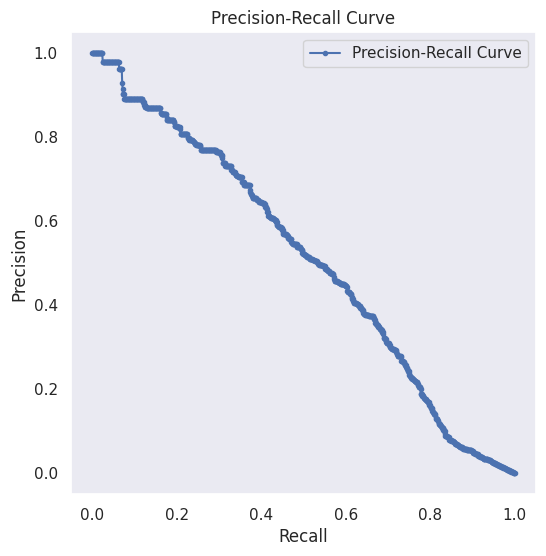

In [ ]:
evaluator = YOLOEvaluator(model_path, test_images_folder, predictions_path)
evaluator.evaluate()
evaluator.plot_precision_recall()

In [ ]:
evaluator.model.predict(
    source=test_images_folder,
    save=True,
    save_txt=True,
    save_conf=True,
    project=predictions_path,
    name="results",
    iou=0.7
)
print(f"Предсказания сохранены в {predictions_path}/results")



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/2627 /content/drive/MyDrive/Colab Notebooks/Task1/Japan/test/images/Japan_000007.jpg: 640x640 (no detections), 15.7ms
image 2/2627 /content/drive/MyDrive/Colab Notebooks/Task1/Japan/test/images/Japan_000016.jpg: 640x640 2 Linear Longitudinal Cracks, 1 Other Corruption, 15.8ms
image 3/2627 /content/drive/MyDrive/Colab Notebooks/Task1/Japan/test/images/Japan_000021.jpg: 640x640 1 Linear Longitudinal Crack, 15.7ms
image 4/2627 /content/drive/MyDri

In [ ]:
def print_directory_structure(start_path, max_depth=2):
    start_path = os.path.abspath(start_path)

    for root, dirs, files in os.walk(start_path):
        level = root.replace(start_path, '').count(os.sep)
        if level > max_depth:
            dirs[:] = []
            continue

        indent = ' ' * 4 * (level)
        print('{}{}/'.format(indent, os.path.basename(root)))
        subindent = ' ' * 4 * (level + 1)
        for f in files:
            print('{}{}'.format(subindent, f))

In [ ]:
current_directory = os.getcwd()

In [ ]:
max_depth = 1

In [ ]:
print_directory_structure(current_directory, max_depth)

Task1/
    Task1_Roads_YOLO_Mary.ipynb
    RDD2022_China_MotorBike.zip
    RDD2022_Japan.zip
    yolo11s.pt
    yolo11n.pt
    yolo11m.pt
    China_MotorBike/
        data.yaml
    Japan/
        data.yaml


In [ ]:
japan_directory = current_directory + "/Japan"
china_directory = current_directory + "/China_MotorBike"

In [ ]:
print_directory_structure(japan_directory, max_depth)

Japan/
    data.yaml
    test/
    train/
        labels.cache
    val/
        labels.cache
    yolo_training/
        args.yaml
        labels_correlogram.jpg
        labels.jpg
        train_batch0.jpg
        train_batch1.jpg
        train_batch2.jpg
        train_batch23670.jpg
        train_batch23671.jpg
        train_batch23672.jpg
        results.csv
        events.out.tfevents.1740955049.9d0d9c30c1cd.85512.6


In [ ]:
print_directory_structure(china_directory, max_depth)

China_MotorBike/
    data.yaml
    yolo11_training5/
        args.yaml
        labels_correlogram.jpg
        labels.jpg
        train_batch0.jpg
        train_batch1.jpg
        train_batch2.jpg
        train_batch8910.jpg
        train_batch8911.jpg
        train_batch8912.jpg
        results.csv
        val_batch0_pred.jpg
        val_batch0_labels.jpg
        val_batch1_pred.jpg
        val_batch1_labels.jpg
        val_batch2_labels.jpg
        val_batch2_pred.jpg
        PR_curve.png
        F1_curve.png
        P_curve.png
        R_curve.png
        confusion_matrix_normalized.png
        confusion_matrix.png
        results.png
        events.out.tfevents.1740916395.9d0d9c30c1cd.413.0
    yolo11_training52/
        val_batch0_labels.jpg
        val_batch0_pred.jpg
        val_batch1_pred.jpg
        val_batch1_labels.jpg
        val_batch2_labels.jpg
        val_batch2_pred.jpg
        PR_curve.png
        F1_curve.png
        P_curve.png
        R_curve.png
        confusion_

In [ ]:
#откорректированный запуск для мультикласса, чтобы поодерживаь структру проекта

if __name__ == "__main__":
    dataset_path = "/content/drive/MyDrive/Colab Notebooks/Task1/Japan"
    processor = DatasetProcessor(dataset_path)

    os.makedirs(f"{dataset_path}/train/labels", exist_ok=True)
    os.makedirs(f"{dataset_path}/val/labels", exist_ok=True)
    os.makedirs(f"{dataset_path}/test/predictions", exist_ok=True)

    processor.convert_xml_to_yolo(f"{dataset_path}/train/annotations/xmls", f"{dataset_path}/train/labels")
    processor.split_train_validation(f"{dataset_path}/train/images", f"{dataset_path}/train/labels")
    processor.create_yaml()

    trainer = YOLOTrainer(yolo_path1, os.path.join(dataset_path, "data.yaml"), dataset_path)
    trained_model = trainer.train()

    test_images_folder = os.path.join(dataset_path, "test/images")
    predictions_path = os.path.join(dataset_path, "test/predictions")

    evaluator = YOLOEvaluator(trained_model, test_images_folder, predictions_path)
    evaluator.evaluate()
    evaluator.plot_precision_recall()

    trained_model.predict(
        source=test_images_folder,
        save=True,
        save_txt=True,
        save_conf=True,
        project=predictions_path,
        name="results",
        iou=0.7
    )

Такой код будет поддерживать следующую структуру проекта:

```

Task1/
│   Task1_Roads_YOLO_Mary.ipynb
│   RDD2022_China_MotorBike.zip
│   RDD2022_Japan.zip
│   yolo11s.pt
│   yolo11m.pt
│
├── China_MotorBike/
│   ├── data.yaml
│   ├── train/
│   │   ├── images/
│   │   ├── labels/
│   │
│   ├── val/
│   │   ├── images/
│   │   ├── labels/
│   │
│   ├── test/
│   │   ├── images/
│   │   ├── predictions/
│
│   ├── runs/
│   │   ├── train/
│   │   ├── val/
│
├── Japan/
│   ├── data.yaml
│   ├── train/
│   │   ├── images/
│   │   ├── labels/
│   │
│   ├── val/
│   │   ├── images/
│   │   ├── labels/
│   │
│   ├── test/
│   │   ├── images/
│   │   ├── predictions/
│
│   ├── runs/
│   │   ├── train/
│   │   ├── val/
```